In [1]:
# Import packages and implement notebook settings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import scipy

pd.set_option('display.max_rows', 1000); pd.set_option('display.max_columns', 1000); pd.set_option('display.width', 1000)

%matplotlib inline 



In [2]:
# Import Ames_HousePrice.csv

housing_df = pd.read_csv('Ames_HousePrice.csv', index_col=0)
housing_df.shape

(2580, 81)

In [3]:
housing_df = housing_df.drop_duplicates()

In [4]:
housing_df.shape

(2579, 81)

In [5]:
housing_df.describe()

,PID,GrLivArea,SalePrice,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
count,2.579000e+03,2579.000000,2579.000000,2579.000000,2117.000000,2579.000000,2579.00000,2579.000000,2579.000000,2579.000000,2565.000000,2578.000000,2578.000000,2578.000000,2578.000000,2579.000000,2579.000000,2579.000000,2577.000000,2577.000000,2579.000000,2579.000000,2579.000000,2579.000000,2579.000000,2579.000000,2450.000000,2578.000000,2578.000000,2579.000000,2579.000000,2579.000000,2579.000000,2579.000000,2579.000000,2579.000000,2579.000000,2579.000000
mean,7.147546e+08,1485.950368,178053.442420,57.694843,68.510628,10119.269484,6.04653,5.618457,1970.325708,1983.765025,99.346979,444.285105,53.259503,539.194725,1036.739333,1144.982939,336.721210,4.246219,0.435390,0.062088,1.550989,0.378054,2.850717,1.040326,6.386972,0.604110,1976.997143,1.747867,466.864624,95.956960,46.103141,23.223342,2.512214,16.162854,1.662660,48.750291,6.152385,2007.839085
std,1.886603e+08,488.723768,75044.983207,42.810137,22.839861,8128.389882,1.36770,1.122200,29.719469,20.483428,175.895686,429.407015,174.454606,425.255818,418.628083,376.031658,424.124904,44.412136,0.518857,0.244557,0.545823,0.499184,0.822852,0.202588,1.535436,0.648683,24.653507,0.738674,207.514072,129.063212,66.067238,64.118627,25.298791,56.803807,30.345262,498.820852,2.669913,1.312088
min,5.263011e+08,334.000000,12789.000000,20.000000,21.000000,1300.000000,1.00000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1895.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000
25%,5.313630e+08,1112.000000,129950.000000,20.000000,57.000000,7406.500000,5.00000,5.000000,1953.000000,1965.000000,0.000000,0.000000,0.000000,215.000000,792.000000,871.500000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1960.000000,1.000000,318.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000
50%,5.354542e+08,1436.000000,159900.000000,50.000000,68.000000,9382.000000,6.00000,5.000000,1972.000000,1992.000000,0.000000,384.000000,0.000000,448.000000,979.500000,1070.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1978.000000,2.000000,474.000000,0.000000,26.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000
75%,9.071806e+08,1733.000000,209750.000000,70.000000,80.000000,11485.500000,7.00000,6.000000,1999.000000,2003.000000,158.000000,732.000000,0.000000,784.000000,1266.750000,1364.000000,703.000000,0.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2000.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000
max,1.007100e+09,4676.000000,755000.000000,190.000000,313.000000,215245.000000,10.00000,9.000000,2010.000000,2010.000000,1600.000000,2288.000000,1526.000000,2336.000000,3206.000000,3820.000000,1872.000000,1064.000000,3.000000,2.000000,4.000000,2.000000,6.000000,3.000000,13.000000,4.000000,2010.000000,5.000000,1488.000000,1424.000000,742.000000,1012.000000,508.000000,576.000000,800.000000,15500.000000,12.000000,2010.000000


In [6]:
housing_df.head()

,PID,GrLivArea,SalePrice,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1,909176150,856,126000,30,RL,NaN,7890,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,SWISU,Norm,Norm,1Fam,1Story,6,6,1939,1950,Gable,CompShg,Wd Sdng,Wd Sdng,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,238.0,Unf,0.0,618.0,856.0,GasA,TA,Y,SBrkr,856,0,0,1.0,0.0,1,0,2,1,TA,4,Typ,1,Gd,Detchd,1939.0,Unf,2.0,399.0,TA,TA,Y,0,0,0,0,166,0,NaN,NaN,NaN,0,3,2010,WD,Normal
2,905476230,1049,139500,120,RL,42.0,4235,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,1Story,5,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,BrkFace,149.0,Gd,TA,CBlock,Gd,TA,Mn,GLQ,552.0,ALQ,393.0,104.0,1049.0,GasA,TA,Y,SBrkr,1049,0,0,1.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1984.0,Fin,1.0,266.0,TA,TA,Y,0,105,0,0,0,0,NaN,NaN,NaN,0,2,2009,WD,Normal
3,911128020,1001,124900,30,C (all),60.0,6060,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Norm,Norm,1Fam,1Story,5,9,1930,2007,Hip,CompShg,MetalSd,MetalSd,NaN,0.0,Gd,TA,BrkTil,TA,TA,No,ALQ,737.0,Unf,0.0,100.0,837.0,GasA,Ex,Y,SBrkr,1001,0,0,0.0,0.0,1,0,2,1,Gd,5,Typ,0,NaN,Detchd,1930.0,Unf,1.0,216.0,TA,Po,N,154,0,42,86,0,0,NaN,NaN,NaN,0,11,2007,WD,Normal
4,535377150,1039,114000,70,RL,80.0,8146,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,OldTown,Norm,Norm,1Fam,2Story,4,8,1900,2003,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,Gd,Gd,BrkTil,Fa,TA,No,Unf,0.0,Unf,0.0,405.0,405.0,GasA,Gd,Y,SBrkr,717,322,0,0.0,0.0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1940.0,Unf,1.0,281.0,TA,TA,N,0,0,168,0,111,0,NaN,NaN,NaN,0,5,2009,WD,Normal
5,534177230,1665,227000,60,RL,70.0,8400,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,2Story,8,6,2001,2001,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,643.0,Unf,0.0,167.0,810.0,GasA,Ex,Y,SBrkr,810,855,0,1.0,0.0,2,1,3,1,Gd,6,Typ,0,NaN,Attchd,2001.0,Fin,2.0,528.0,TA,TA,Y,0,45,0,0,0,0,NaN,NaN,NaN,0,11,2009,WD,Normal


In [7]:
manual_cat_col = pd.concat([housing_df.select_dtypes(include = ['object']),housing_df.loc[:,['OverallQual', 'OverallCond']]], axis = 1)

manual_num_col = housing_df.select_dtypes(include = ['int64', 'float64']).drop(columns = ['OverallQual', 'OverallCond'])

In [8]:
housing_df.columns

Index(['PID', 'GrLivArea', 'SalePrice', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch',


# Missing Data Exploration
###

In [9]:
# Assess number of null data

housing_df.isnull().sum(axis=0)[housing_df.isnull().sum(axis=0) > 0]

LotFrontage      462
Alley           2411
MasVnrType      1572
MasVnrArea        14
BsmtQual          69
BsmtCond          69
BsmtExposure      71
BsmtFinType1      69
BsmtFinSF1         1
BsmtFinType2      70
BsmtFinSF2         1
BsmtUnfSF          1
TotalBsmtSF        1
Electrical         1
BsmtFullBath       2
BsmtHalfBath       2
FireplaceQu     1241
GarageType       127
GarageYrBlt      129
GarageFinish     129
GarageCars         1
GarageArea         1
GarageQual       129
GarageCond       129
PoolQC          2570
Fence           2054
MiscFeature     2482
dtype: int64

In [10]:
# Data type for columns with missing values

for col in housing_df.isnull().sum(axis=0)[housing_df.isnull().sum(axis=0) > 0].index:
    print(col + ": " + str(housing_df[col].dtype))
    # print(housing_df[col].value_counts(dropna = False))

LotFrontage: float64
Alley: object
MasVnrType: object
MasVnrArea: float64
BsmtQual: object
BsmtCond: object
BsmtExposure: object
BsmtFinType1: object
BsmtFinSF1: float64
BsmtFinType2: object
BsmtFinSF2: float64
BsmtUnfSF: float64
TotalBsmtSF: float64
Electrical: object
BsmtFullBath: float64
BsmtHalfBath: float64
FireplaceQu: object
GarageType: object
GarageYrBlt: float64
GarageFinish: object
GarageCars: float64
GarageArea: float64
GarageQual: object
GarageCond: object
PoolQC: object
Fence: object
MiscFeature: object


In [11]:
# Object columns with missing values

missing_values_categorical_col = []

for col in housing_df.isnull().sum(axis=0)[housing_df.isnull().sum(axis=0) > 0].index:
    if str(housing_df[col].dtype) == 'object':
        print(col + ": " + str(housing_df[col].dtype))
        missing_values_categorical_col.append(col)
    

Alley: object
MasVnrType: object
BsmtQual: object
BsmtCond: object
BsmtExposure: object
BsmtFinType1: object
BsmtFinType2: object
Electrical: object
FireplaceQu: object
GarageType: object
GarageFinish: object
GarageQual: object
GarageCond: object
PoolQC: object
Fence: object
MiscFeature: object


Text(0.5, 1.0, 'Categorical Variables: Missingness')

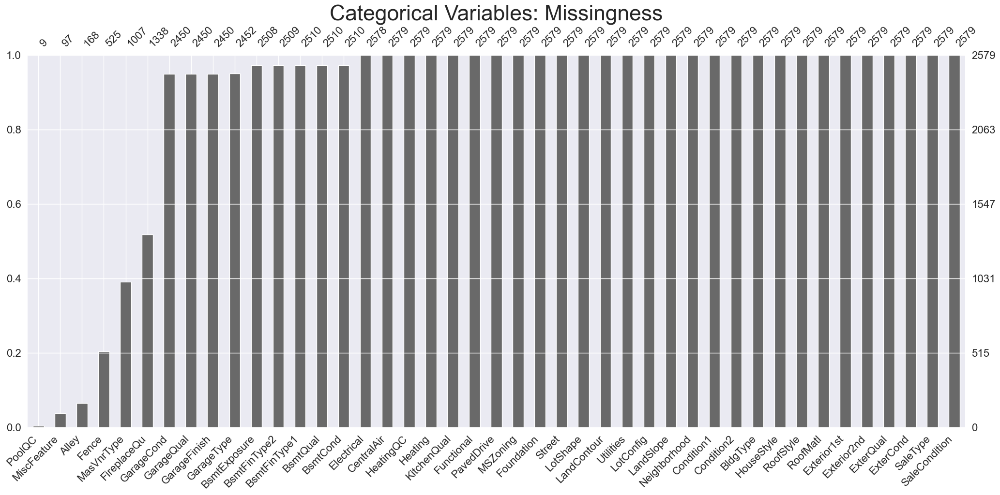

In [12]:
# Missing categorical values
sns.set_theme(style="darkgrid")

msno.bar(housing_df.select_dtypes(include=['object']), sort = 'ascending')
plt.title('Categorical Variables: Missingness', fontsize = 32)


In [13]:
def list_intersection(lst1, lst2):
    lst3 = [value for value in lst1 if value in lst2]
    return lst3

Text(0.5, 1.0, 'Categorical Variables: Missingness')

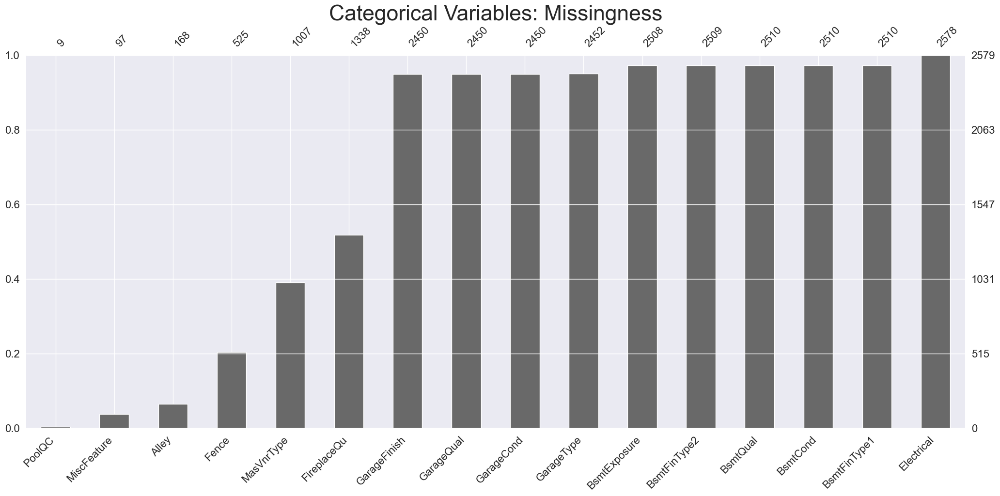

In [14]:
# Missing categorical values
sns.set_theme(style="darkgrid")

msno.bar(housing_df.loc[:,list_intersection(housing_df.isnull().sum(axis=0)[housing_df.isnull().sum(axis=0) > 0].index, housing_df.select_dtypes(include=['object']).columns)], sort='ascending')
plt.title('Categorical Variables: Missingness', fontsize = 32)


In [15]:
cat_imputation_list = [('PoolQC', 'No Pool'), ('MiscFeature', 'None'), ('Fence', 'No Fence'),\
                       ('Alley', 'No alley access'),('MasVnrType', 'None'), ('FireplaceQu', 'No Fireplace'),\
                       ('GarageCond', 'No Garage'), ('BsmtQual', 'No Basement'), ('BsmtCond', 'No Basement'),\
                       ('BsmtExposure', 'No Basement'), ('BsmtFinType1', 'No Basement'),\
                       ('BsmtFinType2', 'No Basement'),('GarageType', 'No Garage'), ('GarageFinish', 'No Garage'),\
                       ('GarageQual', 'No Garage')]


In [16]:
for col in cat_imputation_list:
    housing_df[col[0]] = housing_df[col[0]].fillna(col[1])
  

In [17]:
housing_df['Electrical'].value_counts(normalize=True)

Electrical
SBrkr    0.916990
FuseA    0.065167
FuseF    0.015128
FuseP    0.002715
Name: proportion, dtype: float64

In [18]:
housing_df['Electrical'] = housing_df['Electrical'].fillna('SBrkr')

<Axes: >

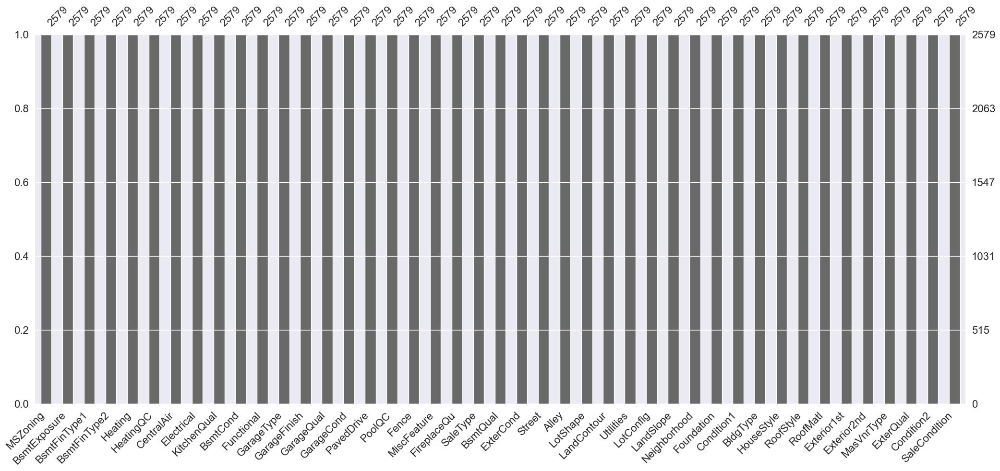

In [19]:
# Missing categorical values

msno.bar(housing_df.select_dtypes(include=['object']), sort = 'ascending')


In [20]:
# Float64 columns with missing values

missing_values_numerical_col = []

for col in housing_df.isnull().sum(axis=0)[housing_df.isnull().sum(axis=0) > 0].index:
    if str(housing_df[col].dtype) == 'float64' or str(housing_df[col].dtype) == 'int64':
        print(col + ": " + str(housing_df[col].dtype))
        missing_values_numerical_col.append(col)
    

LotFrontage: float64
MasVnrArea: float64
BsmtFinSF1: float64
BsmtFinSF2: float64
BsmtUnfSF: float64
TotalBsmtSF: float64
BsmtFullBath: float64
BsmtHalfBath: float64
GarageYrBlt: float64
GarageCars: float64
GarageArea: float64


<Axes: >

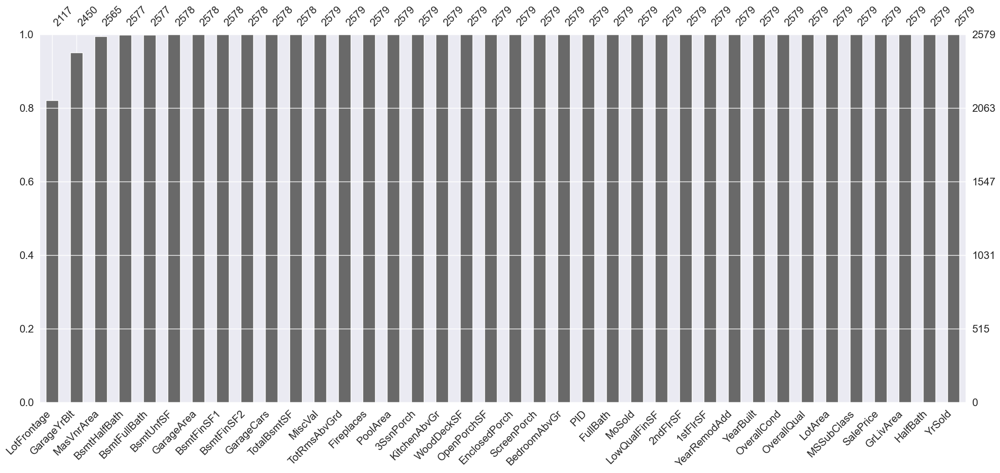

In [21]:
msno.bar(housing_df.select_dtypes(include=['int64','float64']), sort = 'ascending')


Text(0.5, 1.0, 'Numerical Variables: Missingness')

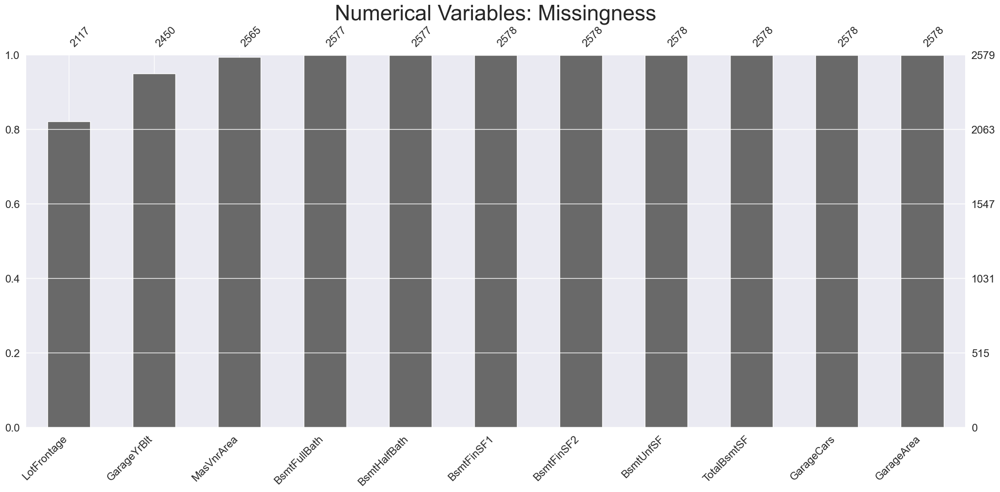

In [22]:
# Missing categorical values
sns.set_theme(style="darkgrid")

msno.bar(housing_df.loc[:,list_intersection(housing_df.isnull().sum(axis=0)[housing_df.isnull().sum(axis=0) > 0].index, housing_df.select_dtypes(include=['int64','float64']).columns)], sort='ascending')
plt.title('Numerical Variables: Missingness', fontsize = 32)


In [23]:
# NEW Imputation of mean for missing data in numerical columns

for i in missing_values_numerical_col:
    if i == 'MasVnrArea':
        housing_df[i] = np.where(housing_df['MasVnrType'] != 'None', housing_df[i].fillna(housing_df[i].mean()), 0)
    elif i == 'BsmtFinSF1':
        housing_df[i] = np.where(housing_df['BsmtFinType1'] != 'No Basement', housing_df[i].fillna(housing_df[i].mean()), 0)
    elif i == 'BsmtFinSF2':
        housing_df[i] = np.where(housing_df['BsmtFinType2'] != 'No Basement', housing_df[i].fillna(housing_df[i].mean()), 0)
    elif i == 'BsmtUnfSF':
        housing_df[i] = np.where(housing_df['BsmtCond'] != 'No Basement', housing_df[i].fillna(housing_df[i].mean()), 0)
    elif i == 'TotalBsmtSF':
        housing_df[i] = np.where(housing_df['BsmtCond'] != 'No Basement', housing_df[i].fillna(housing_df[i].mean()), 0)
    elif i == 'BsmtFullBath':
        housing_df[i] = np.where(housing_df['BsmtCond'] != 'No Basement', housing_df[i].fillna(housing_df[i].mean()), 0)
    elif i == 'BsmtHalfBath':
        housing_df[i] = np.where(housing_df['BsmtCond'] != 'No Basement', housing_df[i].fillna(housing_df[i].mean()), 0)
    elif i == 'GarageYrBlt':
        housing_df[i] = np.where(housing_df['GarageType'] != 'No Garage', housing_df[i].fillna(housing_df[i].mean()), 0)
    elif i == 'GarageCars':
        housing_df[i] = np.where(housing_df['GarageType'] != 'No Garage', housing_df[i].fillna(housing_df[i].mean()), 0)
    elif i == 'GarageArea':
        housing_df[i] = np.where(housing_df['GarageType'] != 'No Garage', housing_df[i].fillna(housing_df[i].mean()), 0)
    else:
        housing_df[i] = housing_df[i].fillna(housing_df[i].mean())


In [24]:
# Checking if missing values have been dealt with:

for col in housing_df.isnull().sum(axis=0)[housing_df.isnull().sum(axis=0) > 0].index:
    if str(housing_df[col].dtype) == 'float64' or str(housing_df[col].dtype) == 'int64':
        print(col + ": " + str(housing_df[col].dtype))


<Axes: >

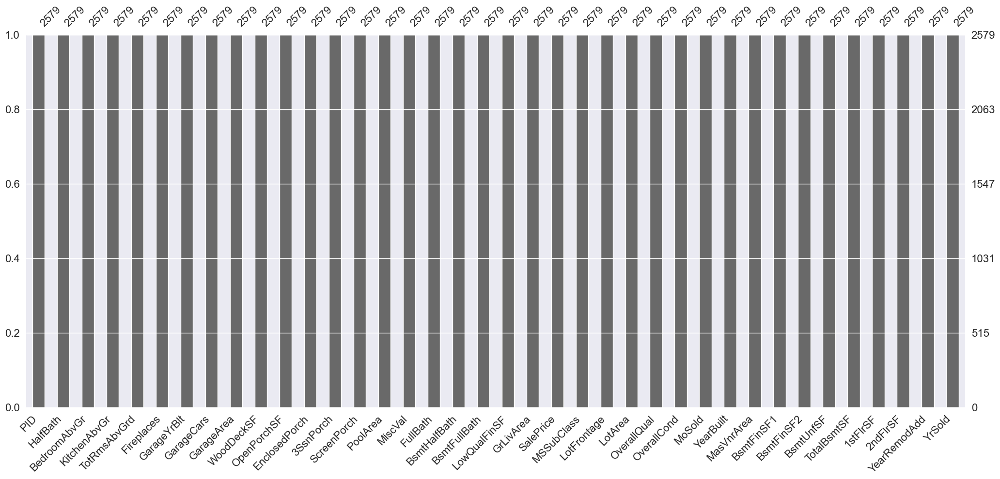

In [25]:
msno.bar(housing_df.select_dtypes(include=['int64','float64']), sort = 'ascending')


# Feature Engineering


In [26]:


housing_df['TotalSF'] = housing_df['GrLivArea'] + housing_df['TotalBsmtSF'] # Creating total square footage column
housing_df['HighQualFinSF'] = housing_df['TotalSF'] - housing_df['LowQualFinSF'] # Creating high quality square footage column
housing_df['BsmtFinSF'] = housing_df['TotalBsmtSF'] - housing_df['BsmtUnfSF'] # Creating finished basement square footage column 
housing_df['YearsBetweenBuildvsRemod'] = housing_df['YearRemodAdd'] - housing_df['YearBuilt'] # Creating a duration between construction year and remodeling year
housing_df['TotalFullBath'] = housing_df['BsmtFullBath'] + housing_df['FullBath'] # Total full bathrooms
housing_df['TotalHalfBath'] = housing_df['BsmtHalfBath'] + housing_df['HalfBath'] # Total half bathrooms
housing_df['TotalPorch_DeckSF'] = housing_df['WoodDeckSF'] + housing_df['OpenPorchSF'] + housing_df['EnclosedPorch'] + housing_df['3SsnPorch'] + housing_df['ScreenPorch'] # Total outdoor deck/porch area
housing_df['YearsBetweenBuildvsSold'] = housing_df['YrSold'] - housing_df['YearBuilt'] # Creating a duration between construction year and selling year
housing_df['YearsBetweenRemodvsSold'] = housing_df['YrSold'] - housing_df['YearRemodAdd'] # Creating a duration between construction year and selling year


housing_df.head()

,PID,GrLivArea,SalePrice,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,TotalSF,HighQualFinSF,BsmtFinSF,YearsBetweenBuildvsRemod,TotalFullBath,TotalHalfBath,TotalPorch_DeckSF,YearsBetweenBuildvsSold,YearsBetweenRemodvsSold
1,909176150,856,126000,30,RL,68.510628,7890,Pave,No alley access,Reg,Lvl,AllPub,Corner,Gtl,SWISU,Norm,Norm,1Fam,1Story,6,6,1939,1950,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,238.0,Unf,0.0,618.0,856.0,GasA,TA,Y,SBrkr,856,0,0,1.0,0.0,1,0,2,1,TA,4,Typ,1,Gd,Detchd,1939.0,Unf,2.0,399.0,TA,TA,Y,0,0,0,0,166,0,No Pool,No Fence,None,0,3,2010,WD,Normal,1712.0,1712.0,238.0,11,2.0,0.0,166,71,60
2,905476230,1049,139500,120,RL,42.000000,4235,Pave,No alley access,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,1Story,5,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,BrkFace,149.0,Gd,TA,CBlock,Gd,TA,Mn,GLQ,552.0,ALQ,393.0,104.0,1049.0,GasA,TA,Y,SBrkr,1049,0,0,1.0,0.0,2,0,2,1,Gd,5,Typ,0,No Fireplace,Attchd,1984.0,Fin,1.0,266.0,TA,TA,Y,0,105,0,0,0,0,No Pool,No Fence,None,0,2,2009,WD,Normal,2098.0,2098.0,945.0,0,3.0,0.0,105,25,25
3,911128020,1001,124900,30,C (all),60.000000,6060,Pave,No alley access,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Norm,Norm,1Fam,1Story,5,9,1930,2007,Hip,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,BrkTil,TA,TA,No,ALQ,737.0,Unf,0.0,100.0,837.0,GasA,Ex,Y,SBrkr,1001,0,0,0.0,0.0,1,0,2,1,Gd,5,Typ,0,No Fireplace,Detchd,1930.0,Unf,1.0,216.0,TA,Po,N,154,0,42,86,0,0,No Pool,No Fence,None,0,11,2007,WD,Normal,1838.0,1838.0,737.0,77,1.0,0.0,282,77,0
4,535377150,1039,114000,70,RL,80.000000,8146,Pave,No alley access,Reg,Lvl,AllPub,Corner,Gtl,OldTown,Norm,Norm,1Fam,2Story,4,8,1900,2003,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,Gd,BrkTil,Fa,TA,No,Unf,0.0,Unf,0.0,405.0,405.0,GasA,Gd,Y,SBrkr,717,322,0,0.0,0.0,1,0,2,1,TA,6,Typ,0,No Fireplace,Detchd,1940.0,Unf,1.0,281.0,TA,TA,N,0,0,168,0,111,0,No Pool,No Fence,None,0,5,2009,WD,Normal,1444.0,1444.0,0.0,103,1.0,0.0,279,109,6
5,534177230,1665,227000,60,RL,70.000000,8400,Pave,No alley access,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,2Story,8,6,2001,2001,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,643.0,Unf,0.0,167.0,810.0,GasA,Ex,Y,SBrkr,810,855,0,1.0,0.0,2,1,3,1,Gd,6,Typ,0,No Fireplace,Attchd,2001.0,Fin,2.0,528.0,TA,TA,Y,0,45,0,0,0,0,No Pool,No Fence,None,0,11,2009,WD,Normal,2475.0,2475.0,643.0,0,3.0,1.0,45,8,8


# Multicolinearity


<Axes: >

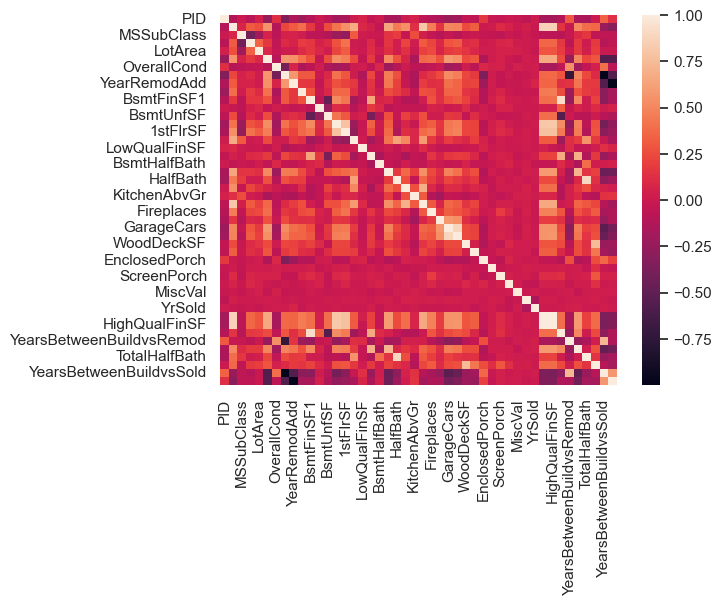

In [27]:
numerical_cols = []

for col in housing_df.drop(columns= 'SalePrice').columns:
    if str(housing_df[col].dtype) == 'float64' or str(housing_df[col].dtype) == 'int64':
        numerical_cols.append(col)


sns.heatmap(housing_df[numerical_cols].corr())

In [28]:
correlations = []
corr_threshold = 0.70

for i, col_x in enumerate(housing_df[numerical_cols].columns):
    for col_y in housing_df[numerical_cols].columns[i+1:]:
        correlation = housing_df[numerical_cols][col_x].corr(housing_df[numerical_cols][col_y])
        if abs(correlation) >= corr_threshold:
            correlations.append((col_x, col_y, correlation))
        
correlations

[('GrLivArea', 'TotRmsAbvGrd', 0.8074321465411463),
 ('GrLivArea', 'TotalSF', 0.8656564290761636),
 ('GrLivArea', 'HighQualFinSF', 0.8611810571573008),
 ('YearBuilt', 'YearsBetweenBuildvsRemod', -0.7310744762557765),
 ('YearBuilt', 'YearsBetweenBuildvsSold', -0.9990257923905616),
 ('YearRemodAdd', 'YearsBetweenRemodvsSold', -0.997946302273081),
 ('BsmtFinSF1', 'BsmtFinSF', 0.9234913945746727),
 ('TotalBsmtSF', '1stFlrSF', 0.7842803487175513),
 ('TotalBsmtSF', 'TotalSF', 0.8118360667967723),
 ('TotalBsmtSF', 'HighQualFinSF', 0.8139702349374843),
 ('1stFlrSF', 'TotalSF', 0.7758180031965565),
 ('1stFlrSF', 'HighQualFinSF', 0.7769863539287356),
 ('FullBath', 'TotalFullBath', 0.717073793832169),
 ('HalfBath', 'TotalHalfBath', 0.8924545367496917),
 ('GarageCars', 'GarageArea', 0.8896850299044919),
 ('WoodDeckSF', 'TotalPorch_DeckSF', 0.7476548696861004),
 ('TotalSF', 'HighQualFinSF', 0.9983060746627743),
 ('YearsBetweenBuildvsRemod', 'YearsBetweenBuildvsSold', 0.7323719489889834)]

In [29]:
housing_df[numerical_cols].corr()#[housing_df[numerical_cols].corr()>0.8]

,PID,GrLivArea,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,HighQualFinSF,BsmtFinSF,YearsBetweenBuildvsRemod,TotalFullBath,TotalHalfBath,TotalPorch_DeckSF,YearsBetweenBuildvsSold,YearsBetweenRemodvsSold
PID,1.000000,-0.102485,-0.005257,-0.086623,0.041946,-0.246941,0.119904,-0.337693,-0.128180,-0.225189,-0.112997,-0.002287,-0.074745,-0.193044,-0.153914,0.012270,0.058221,-0.044601,0.001754,-0.153868,-0.173275,0.001704,0.047850,-0.074446,-0.108920,-0.140986,-0.220712,-0.198881,-0.041592,-0.054581,0.168961,-0.021163,-0.032351,-0.006506,-0.022490,-0.059359,0.002799,-0.171607,-0.175137,-0.108185,0.300943,-0.143959,-0.159199,-0.003186,0.337708,0.128616
GrLivArea,-0.102485,1.000000,0.070821,0.311393,0.260286,0.560125,-0.105739,0.228643,0.306512,0.384960,0.165247,-0.021188,0.246122,0.410456,0.539168,0.664967,0.088953,0.043526,-0.053456,0.644277,0.445438,0.538346,0.129840,0.807432,0.457867,0.153051,0.495269,0.477185,0.247890,0.321950,0.000263,0.008733,0.097582,0.057947,-0.003922,0.038694,-0.008007,0.865656,0.861181,0.148320,-0.020985,0.502929,0.387119,0.366412,-0.228923,-0.307640
MSSubClass,-0.005257,0.070821,1.000000,-0.406991,-0.198025,0.056422,-0.075520,0.053792,0.056671,0.017054,-0.073689,-0.073143,-0.112819,-0.220818,-0.255803,0.306995,0.013466,-0.001635,-0.010421,0.144434,0.181923,-0.023757,0.251346,0.032076,-0.047751,-0.094126,-0.032039,-0.091197,-0.017710,-0.007698,-0.028561,-0.041806,-0.055012,-0.013435,-0.027233,0.007147,-0.025459,-0.075885,-0.076731,-0.098150,-0.017781,0.104804,0.163264,-0.054660,-0.054898,-0.058419
LotFrontage,-0.086623,0.311393,-0.406991,1.000000,0.341555,0.167060,-0.048798,0.094306,0.059416,0.184097,0.161161,0.047347,0.094234,0.280829,0.400398,0.004873,-0.009997,0.094688,-0.025905,0.152245,0.023786,0.222832,0.017170,0.311072,0.220749,0.093290,0.282102,0.314483,0.107456,0.130958,0.003251,0.030256,0.076184,0.086033,0.012532,0.002308,-0.002028,0.353568,0.354438,0.170968,-0.064394,0.177689,0.010248,0.172655,-0.094365,-0.059666
LotArea,0.041946,0.260286,-0.198025,0.341555,1.000000,0.080701,-0.032731,0.012510,0.010478,0.103984,0.163599,0.082454,0.020047,0.222304,0.313097,0.022371,-0.000324,0.117074,0.027106,0.124488,0.026600,0.140574,-0.014553,0.204511,0.245103,0.068514,0.175881,0.199276,0.155787,0.085048,0.017734,0.017732,0.053665,0.052643,0.040231,0.010377,-0.017174,0.288712,0.288966,0.186451,-0.006383,0.172937,0.036818,0.188401,-0.013264,-0.011602
OverallQual,-0.246941,0.560125,0.056422,0.167060,0.080701,1.000000,-0.095839,0.574278,0.546157,0.400912,0.274491,-0.031845,0.256120,0.528623,0.454517,0.247109,-0.044392,0.173729,-0.050401,0.508113,0.271937,0.067181,-0.153769,0.360846,0.388030,0.267893,0.580838,0.538109,0.250016,0.286714,-0.134417,0.014199,0.049816,-0.002500,-0.025857,0.016328,0.005255,0.648877,0.651990,0.248047,-0.238792,0.493828,0.228300,0.284100,-0.573862,-0.546914
OverallCond,0.119904,-0.105739,-0.075520,-0.048798,-0.032731,-0.095839,1.000000,-0.397229,0.065353,-0.141426,-0.064860,0.030498,-0.124465,-0.180353,-0.156588,0.014995,0.019032,-0.058571,0.084901,-0.210139,-0.096247,0.004245,-0.075618,-0.072538,-0.046655,-0.008978,-0.195685,-0.168205,0.014261,-0.067353,0.085962,0.041918,0.050222,-0.021186,0.046029,0.012422,0.017824,-0.166723,-0.167967,-0.049881,0.533788,-0.194974,-0.050477,0.042296,0.397888,-0.064340
YearBuilt,-0.337693,0.228643,0.053792,0.094306,0.012510,0.574278,-0.397229,1.000000,0.572041,0.301006,0.304057,-0.011015,0.092334,0.401201,0.294730,0.015997,-0.132151,0.229607,-0.028783,0.449845,0.273610,-0.049197,-0.137091,0.095630,0.167476,0.243319,0.519046,0.462939,0.227066,0.179431,-0.361158,0.009476,-0.042013,0.004904,-0.027398,-0.008154,0.014804,0

# EDA

In [30]:
housing_df.shape

(2579, 90)

array([[<Axes: title={'center': 'PID'}>,
        <Axes: title={'center': 'GrLivArea'}>,
        <Axes: title={'center': 'SalePrice'}>,
        <Axes: title={'center': 'MSSubClass'}>,
        <Axes: title={'center': 'LotFrontage'}>,
        <Axes: title={'center': 'LotArea'}>,
        <Axes: title={'center': 'OverallQual'}>],
       [<Axes: title={'center': 'OverallCond'}>,
        <Axes: title={'center': 'YearBuilt'}>,
        <Axes: title={'center': 'YearRemodAdd'}>,
        <Axes: title={'center': 'MasVnrArea'}>,
        <Axes: title={'center': 'BsmtFinSF1'}>,
        <Axes: title={'center': 'BsmtFinSF2'}>,
        <Axes: title={'center': 'BsmtUnfSF'}>],
       [<Axes: title={'center': 'TotalBsmtSF'}>,
        <Axes: title={'center': '1stFlrSF'}>,
        <Axes: title={'center': '2ndFlrSF'}>,
        <Axes: title={'center': 'LowQualFinSF'}>,
        <Axes: title={'center': 'BsmtFullBath'}>,
        <Axes: title={'center': 'BsmtHalfBath'}>,
        <Axes: title={'center': 'FullBath'}>

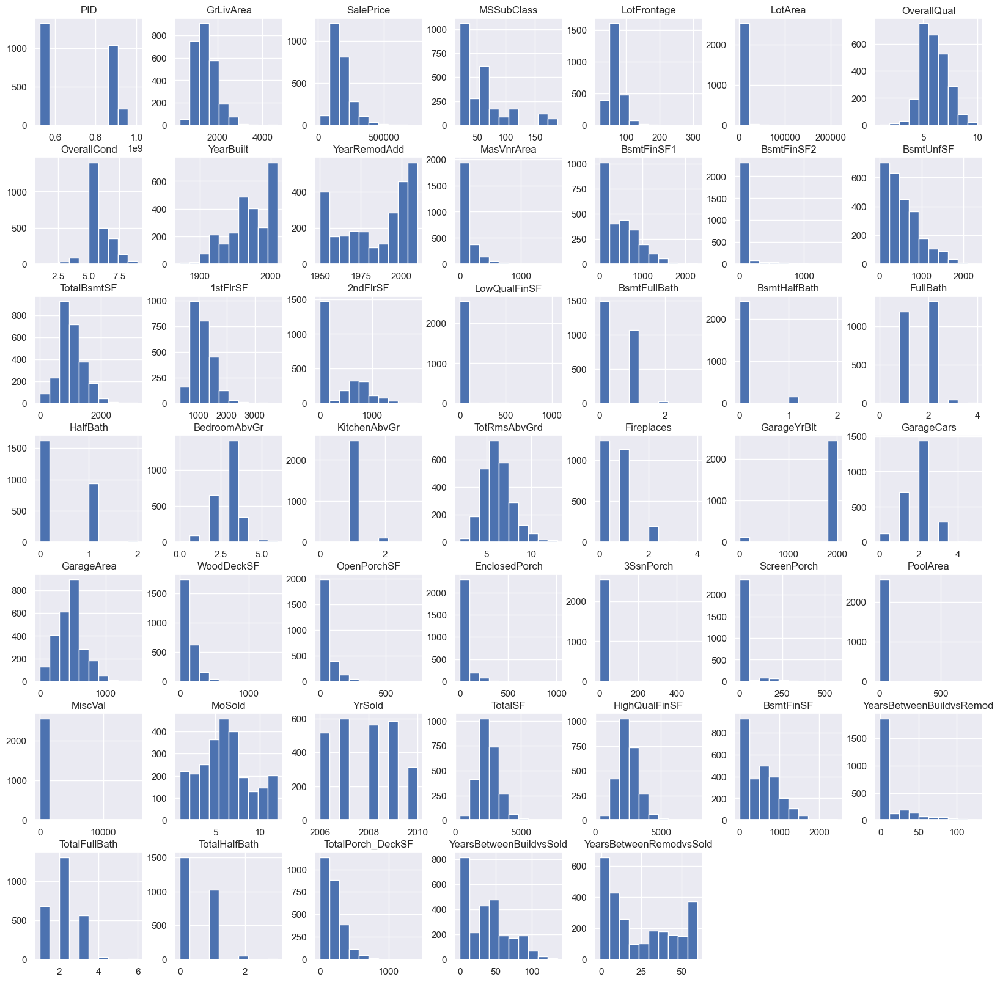

In [31]:
# Inspecting if numerical variables are normally distributed
sns.set_theme(style="darkgrid")

housing_df.hist(figsize =[20,20])

In [32]:
manual_num_col.columns

Index(['PID', 'GrLivArea', 'SalePrice', 'MSSubClass', 'LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold'], dtype='object')

In [33]:
# Understanding the differences in features normality both with and without log transformation

col_skewness = []
col_kurtosis = []
log_col_skewness = []
log_col_kurtosis = []

for col in manual_num_col.columns:
    col_skewness.append(scipy.stats.skew(housing_df[col], axis=0, bias=True))
    col_kurtosis.append(scipy.stats.kurtosis(housing_df[col], axis=0, fisher=True, bias=True))
    log_col_skewness.append(scipy.stats.skew(np.log1p(housing_df[col]), axis=0, bias=True))
    log_col_kurtosis.append(scipy.stats.kurtosis(np.log1p(housing_df[col]), axis=0, fisher=True, bias=True))
    
skewness_kurtosis_df = pd.DataFrame(data = {'skewness': col_skewness, 'kurtosis': col_kurtosis, 'log_skewness': log_col_skewness, 'log_kurtosis': log_col_kurtosis} )

array([[<Axes: title={'center': 'skewness'}>,
        <Axes: title={'center': 'kurtosis'}>],
       [<Axes: title={'center': 'log_skewness'}>,
        <Axes: title={'center': 'log_kurtosis'}>]], dtype=object)

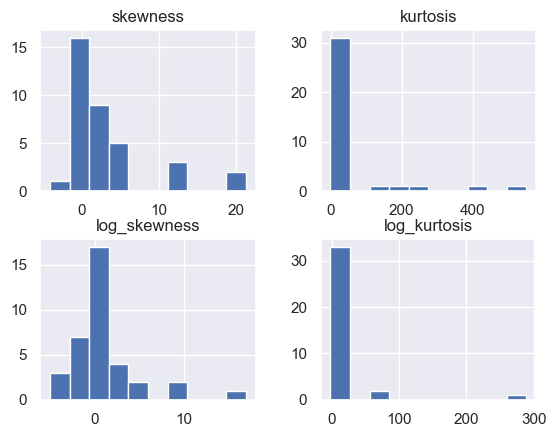

In [34]:
# Plotting feature normality

skewness_kurtosis_df.hist()

In [35]:
skewness_kurtosis_df.describe()

,skewness,kurtosis,log_skewness,log_kurtosis
count,36.000000,36.000000,36.000000,36.000000
mean,3.183399,49.148151,0.994504,15.926547
std,5.606905,123.714643,3.987772,50.656198
min,-4.144736,-1.993952,-5.000453,-1.994731
25%,0.251388,0.001936,-0.646631,-1.331435
50%,0.970707,1.811732,0.046939,1.025970
75%,3.840710,15.814084,0.916727,8.070187
max,21.272745,552.395652,17.009275,289.006759


In [36]:
# Cycle through each column, fit an OLS model, and save the R2 value

import statsmodels.api as sm

rsquared_list = []
pvalue_list = []

for col in housing_df.drop(columns = ['SalePrice']).columns:
    temp_df = housing_df[[col]]
    if str(housing_df[col].dtype) == 'object':
        temp_df = pd.get_dummies(temp_df, columns=[col], drop_first=True)
        temp_df = temp_df.replace({False: 0, True: 1})
        
    temp_df = sm.add_constant(temp_df)
    model = sm.OLS(housing_df['SalePrice'], temp_df).fit()
    rsquared_list.append((col, model.rsquared))  
    pvalue_list.append((col, model.f_pvalue))
    
sorted_rsquared_list = sorted(rsquared_list, key=lambda x: x[1],reverse= True)
sorted_pvalue_list = sorted(pvalue_list, key=lambda x: x[1],reverse= False)

sorted_rsquared_list

[('HighQualFinSF', 0.6752366121236115),
 ('TotalSF', 0.6711961597441904),
 ('OverallQual', 0.6251450369427117),
 ('Neighborhood', 0.5598045031837189),
 ('GrLivArea', 0.5183711142112819),
 ('ExterQual', 0.4854575201032991),
 ('BsmtQual', 0.4813760934695236),
 ('KitchenQual', 0.4580416048451913),
 ('TotalBsmtSF', 0.4258083391417201),
 ('1stFlrSF', 0.41296495239186115),
 ('GarageCars', 0.4083220048597279),
 ('GarageArea', 0.4032415263037169),
 ('TotalFullBath', 0.3544363871141314),
 ('FireplaceQu', 0.30107745613584835),
 ('YearBuilt', 0.2965550613346398),
 ('YearsBetweenBuildvsSold', 0.2964253759455743),
 ('GarageFinish', 0.29077429893133044),
 ('FullBath', 0.2864126086305614),
 ('Foundation', 0.2672579183730027),
 ('YearsBetweenRemodvsSold', 0.26608266499594646),
 ('YearRemodAdd', 0.264936634540639),
 ('MasVnrArea', 0.24784750729845828),
 ('TotRmsAbvGrd', 0.24030189701253757),
 ('Fireplaces', 0.23831275644803818),
 ('GarageType', 0.2344021559748931),
 ('BsmtFinType1', 0.2291913198308504)

In [37]:
# Create column list for top x% of R2 values

top_percent = 0.15
top_rsquared_list = []

for i in list(range(round(top_percent * len(sorted_rsquared_list)))):
    top_rsquared_list.append(sorted_rsquared_list[i][0])

top_rsquared_list

['HighQualFinSF',
 'TotalSF',
 'OverallQual',
 'Neighborhood',
 'GrLivArea',
 'ExterQual',
 'BsmtQual',
 'KitchenQual',
 'TotalBsmtSF',
 '1stFlrSF',
 'GarageCars',
 'GarageArea',
 'TotalFullBath']

In [38]:
# Cycle through each column, fit an OLS model, and save the R2 value

import statsmodels.api as sm

rsquared_list = []
pvalue_list = []

for col in housing_df.drop(columns = ['SalePrice']).columns:
    temp_df = housing_df[[col]]
    if str(housing_df[col].dtype) == 'object':
        temp_df = pd.get_dummies(temp_df, columns=[col], drop_first=True)
        temp_df = temp_df.replace({False: 0, True: 1})
        
    temp_df = sm.add_constant(temp_df)
    model = sm.OLS(housing_df['SalePrice'], temp_df).fit()
    rsquared_list.append((col, model.rsquared))  
    pvalue_list.append((col, model.f_pvalue))
    
sorted_rsquared_list = sorted(rsquared_list, key=lambda x: x[1],reverse= True)
sorted_pvalue_list = sorted(pvalue_list, key=lambda x: x[1],reverse= False)

# Create column list for top x% of R2 values

top_percent = 0.15
top_rsquared_list = []

for i in list(range(round(top_percent * len(sorted_rsquared_list)))):
    top_rsquared_list.append(sorted_rsquared_list[i][0])

top_rsquared_list

['HighQualFinSF',
 'TotalSF',
 'OverallQual',
 'Neighborhood',
 'GrLivArea',
 'ExterQual',
 'BsmtQual',
 'KitchenQual',
 'TotalBsmtSF',
 '1stFlrSF',
 'GarageCars',
 'GarageArea',
 'TotalFullBath']

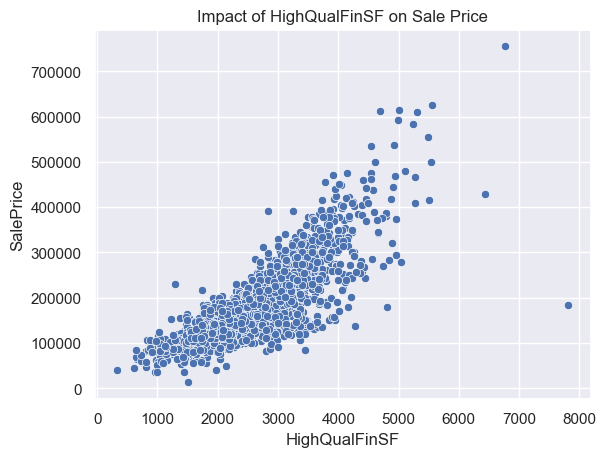

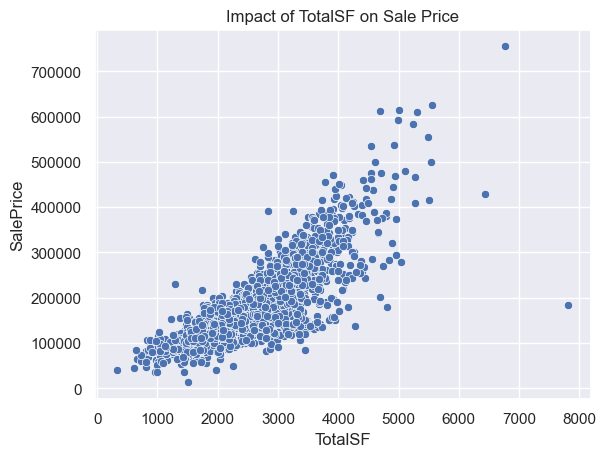

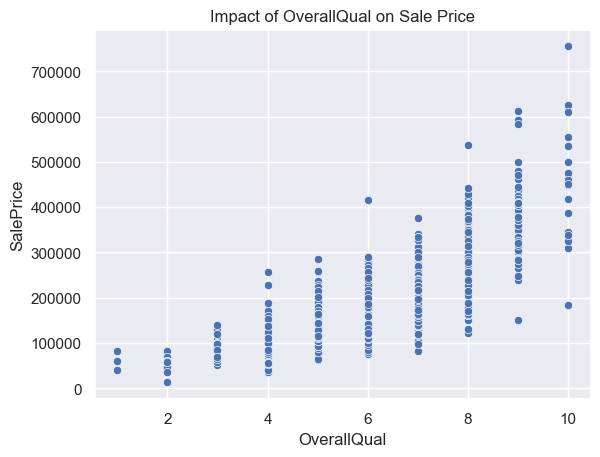

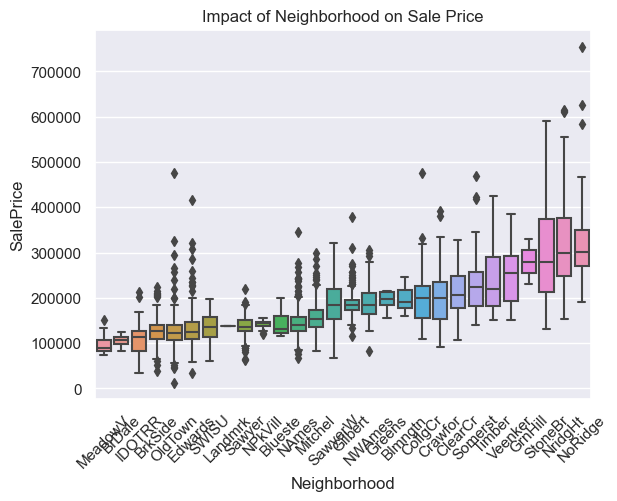

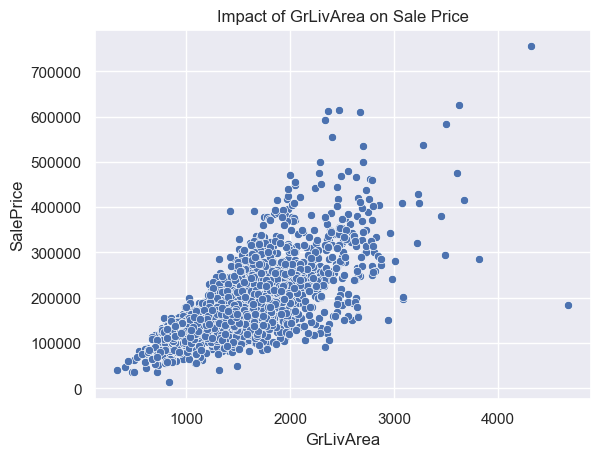

...

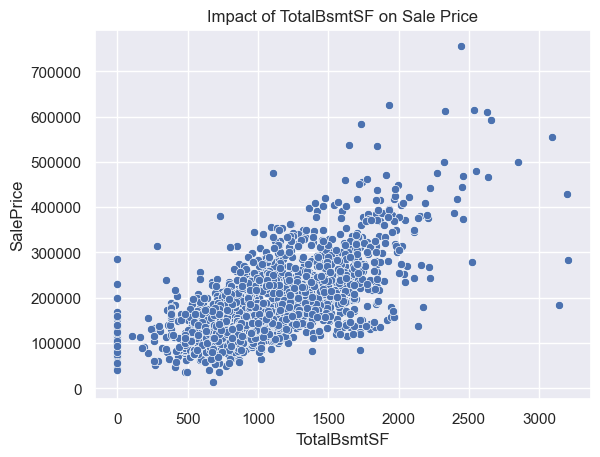

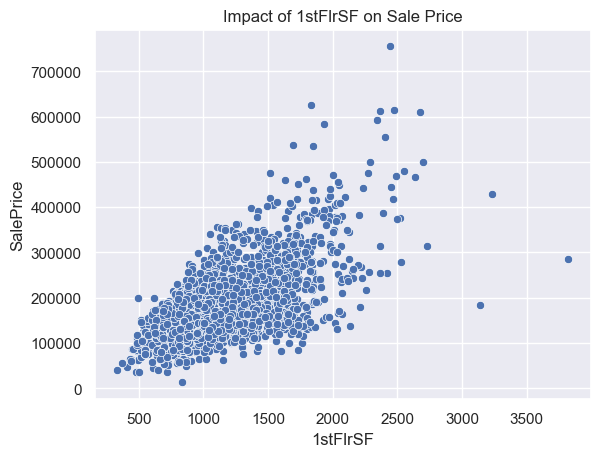

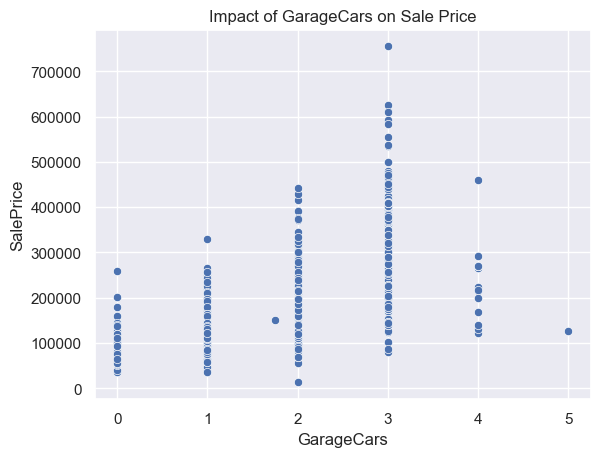

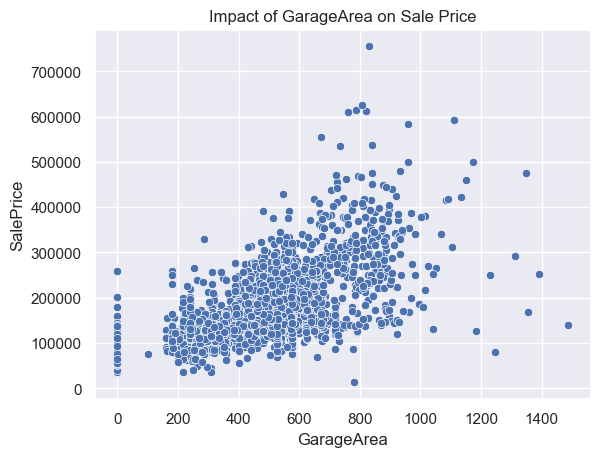

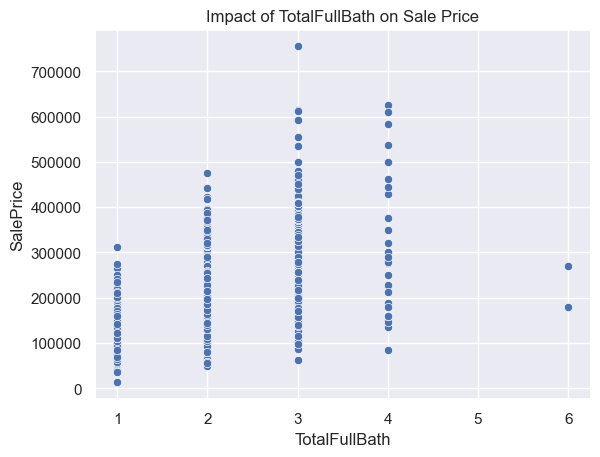

In [39]:
# Looping through top_rsquared_list and creating boxplots for categorical variables and 
# scatterplots for numerical variables

for col in top_rsquared_list:
    if housing_df[col].dtype == 'object':
        temp_df = housing_df.loc[:, [col,'SalePrice']]
        sorted_categories = temp_df.groupby(col)['SalePrice'].mean().sort_values().index
        temp_df[col] = pd.Categorical(temp_df[col], categories=sorted_categories, ordered=True)
        temp_df_sorted = temp_df.sort_values(by=col)
        plot = sns.boxplot(data = temp_df_sorted, x = col, y = 'SalePrice' )
        plot.set_xticklabels(plot.get_xticklabels(), rotation=45)
        plt.title('Impact of ' + col + ' on Sale Price')
        plt.show()
        
    elif housing_df[col].dtype in ['int64', 'float64']:
        temp_df = housing_df.loc[:, [col,'SalePrice']]
        sns.scatterplot(data = temp_df, x = col, y = 'SalePrice' )
        plt.title('Impact of ' + col + ' on Sale Price')
        plt.show()

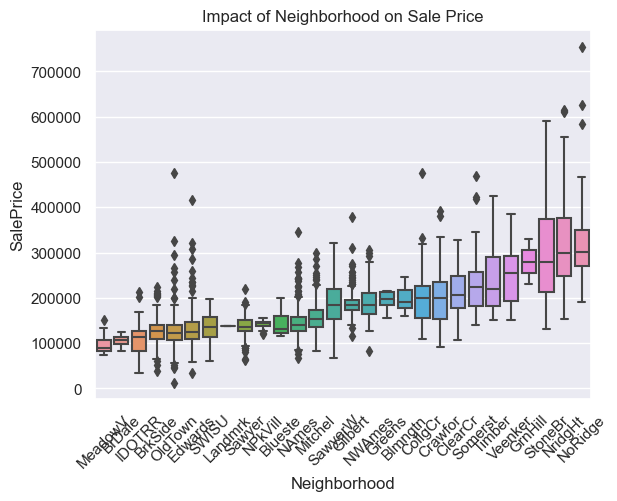

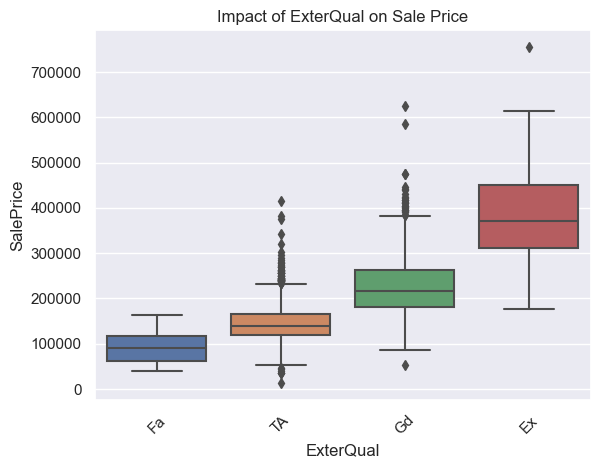

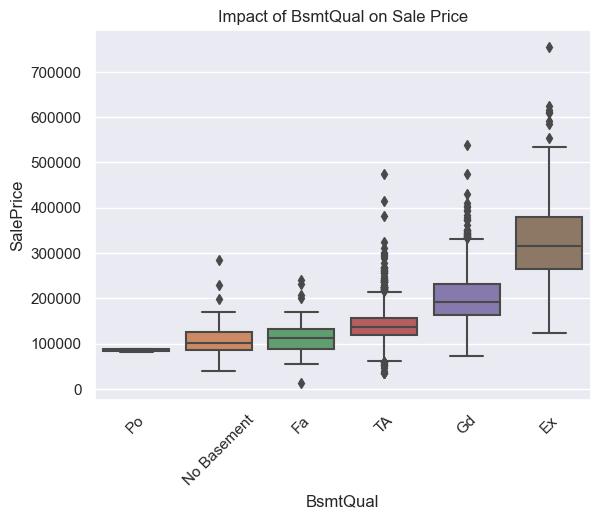

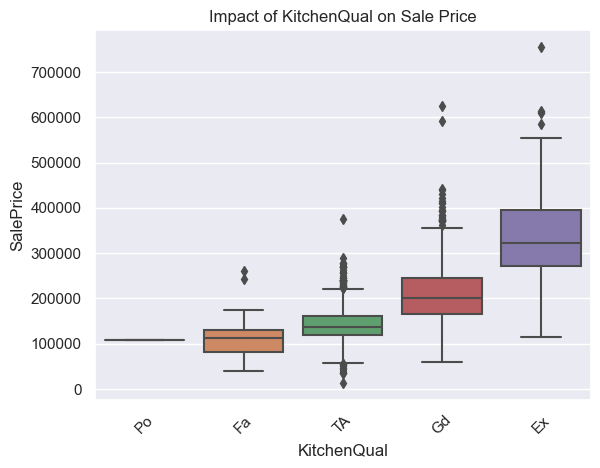

In [40]:
# Looping through categorical columns in top_rsquared_list and creating boxplots against their SalePrice



for col in housing_df.loc[:,top_rsquared_list].select_dtypes(include=['object']).columns:
    temp_df = housing_df.loc[:, [col,'SalePrice']]
    sorted_categories = temp_df.groupby(col)['SalePrice'].mean().sort_values().index
    temp_df[col] = pd.Categorical(temp_df[col], categories=sorted_categories, ordered=True)
    temp_df_sorted = temp_df.sort_values(by=col)
    plot = sns.boxplot(data = temp_df_sorted, x = col, y = 'SalePrice' )
    plot.set_xticklabels(plot.get_xticklabels(), rotation=45)
    plt.title('Impact of ' + col + ' on Sale Price')
    plt.show()
    
    

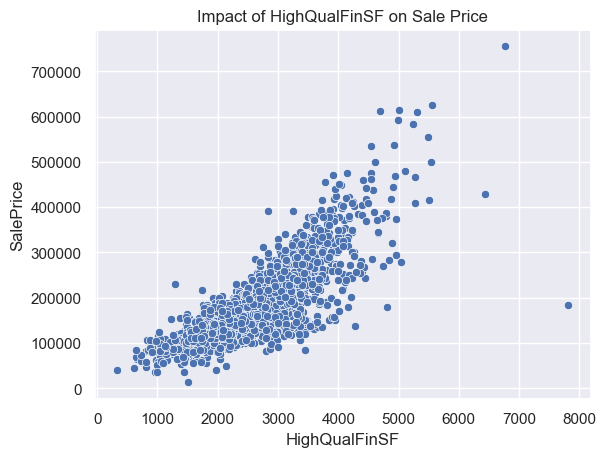

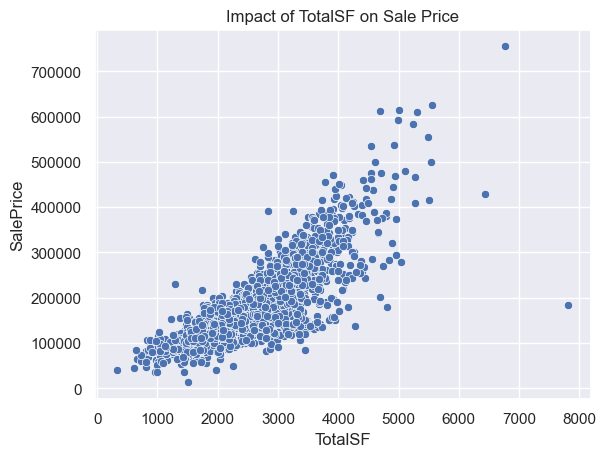

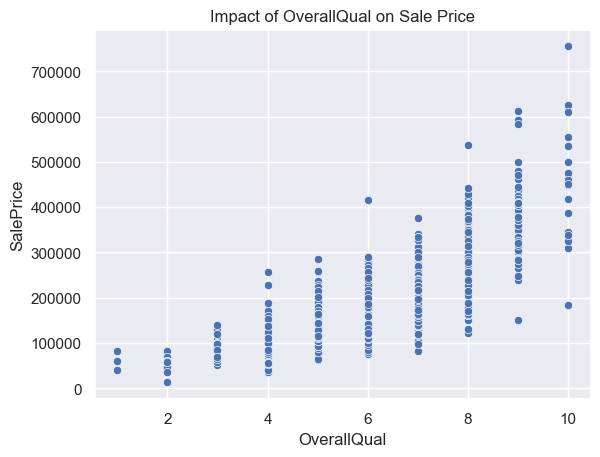

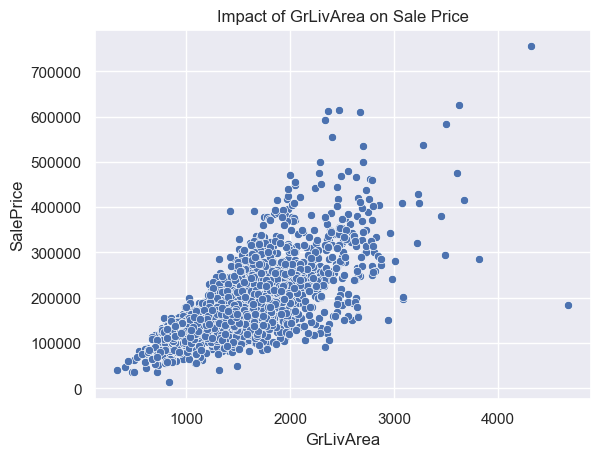

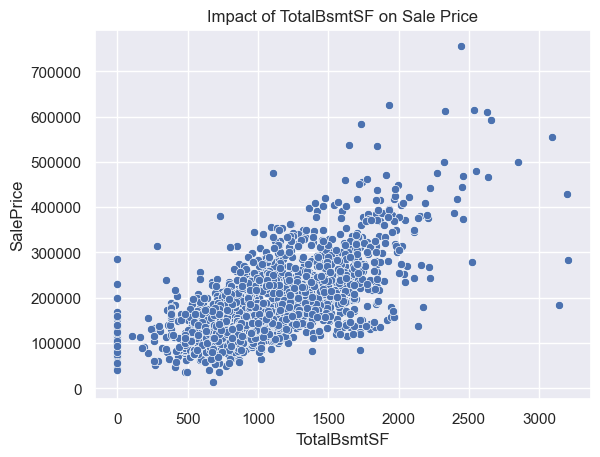

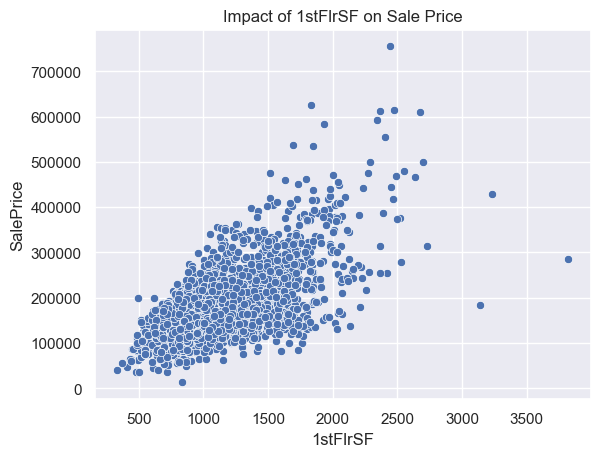

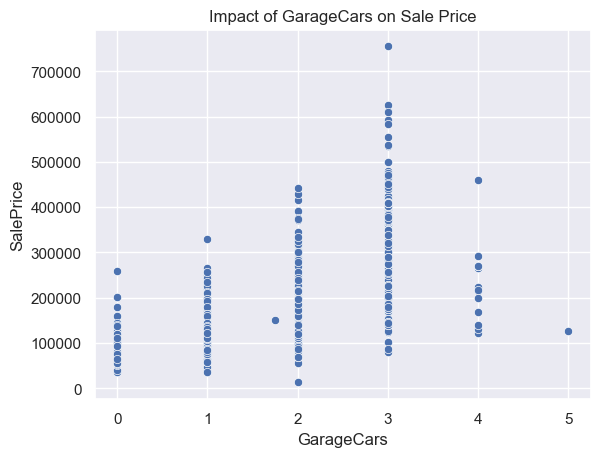

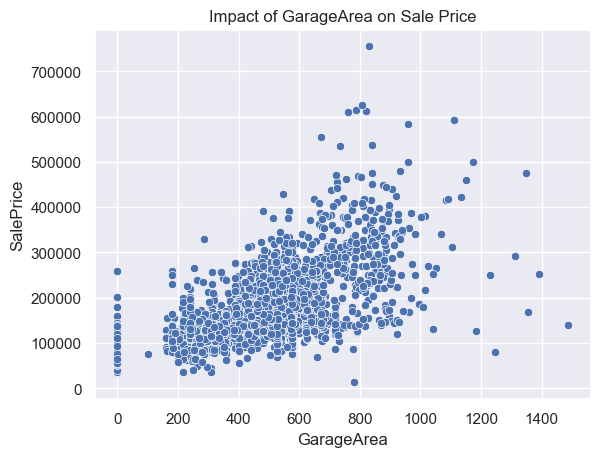

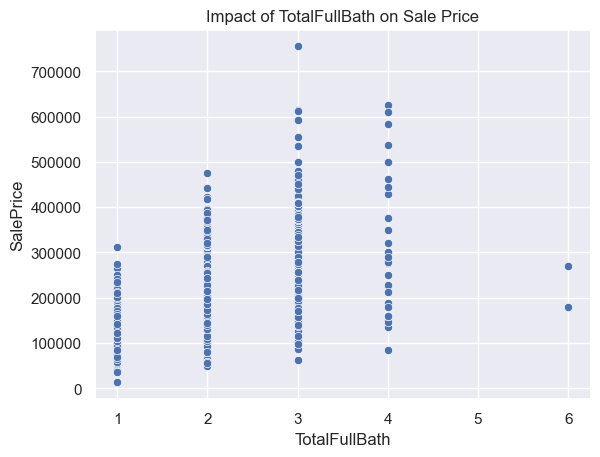

In [41]:
# Looping through numerical columns in top_rsquared_list and creating boxplots against their SalePrice



for col in housing_df.loc[:,top_rsquared_list].select_dtypes(include=['int64', 'float64']).columns:
    temp_df = housing_df.loc[:, [col,'SalePrice']]
    sns.scatterplot(data = temp_df, x = col, y = 'SalePrice' )
    plt.title('Impact of ' + col + ' on Sale Price')
    plt.show()

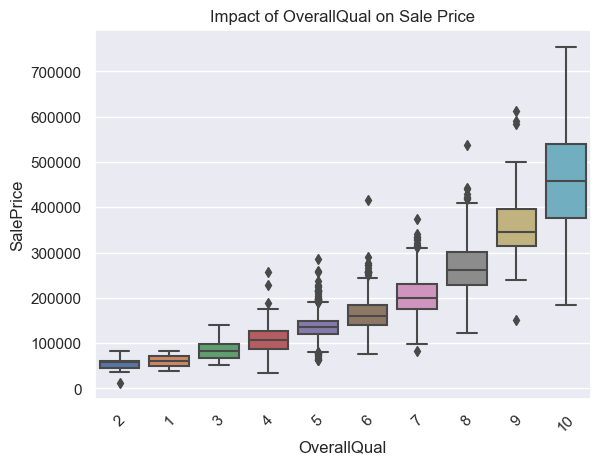

In [42]:
# Boxplot for OverallQual vs. SalePrice


temp_df = housing_df.loc[:, ['OverallQual','SalePrice']]
sorted_categories = temp_df.groupby('OverallQual')['SalePrice'].mean().sort_values().index
temp_df['OverallQual'] = pd.Categorical(temp_df['OverallQual'], categories=sorted_categories, ordered=True)
temp_df_sorted = temp_df.sort_values(by='OverallQual')
plot = sns.boxplot(data = temp_df_sorted, x = 'OverallQual', y = 'SalePrice' )
plot.set_xticklabels(plot.get_xticklabels(), rotation=45)
plt.title('Impact of OverallQual on Sale Price')
plt.show()

/Users/bryceferraro/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:712: UserWarning: Using the boxplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)
/Users/bryceferraro/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


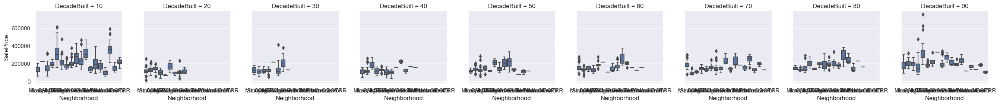

In [43]:

temp_df = housing_df.loc[:, ['Neighborhood','SalePrice','YearBuilt']]
temp_df['YearBuilt'] = temp_df['YearBuilt'].astype(str)
temp_df = temp_df.assign(DecadeBuilt = temp_df.YearBuilt.str[-2:].astype('int'))

def round_down_to_10th(x):
    return int(x / 10) * 10

temp_df['DecadeBuilt'] = temp_df['DecadeBuilt'].apply(round_down_to_10th)
temp_df.loc[temp_df["DecadeBuilt"] < 10, "DecadeBuilt"] = 10

temp_df

g = sns.FacetGrid(temp_df, col="DecadeBuilt")
g.map(sns.boxplot, "Neighborhood", "SalePrice")


0.6752366121236116


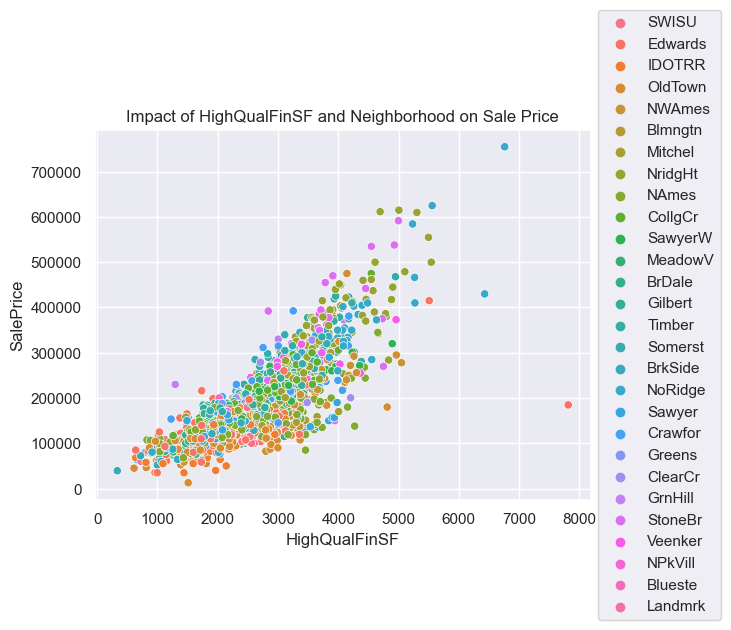

0.6752366121236116


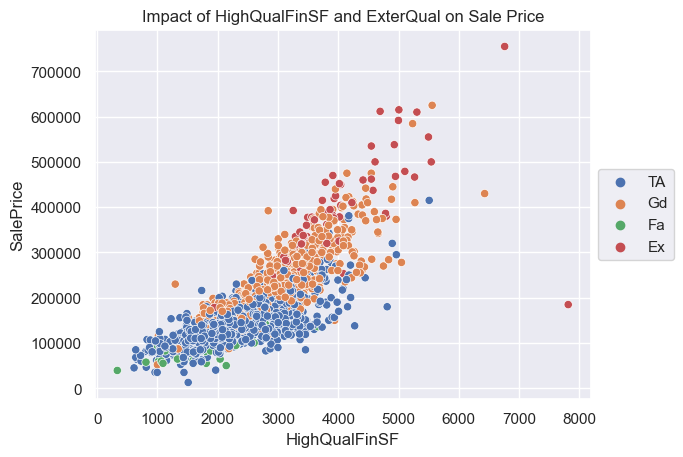

0.6752366121236116


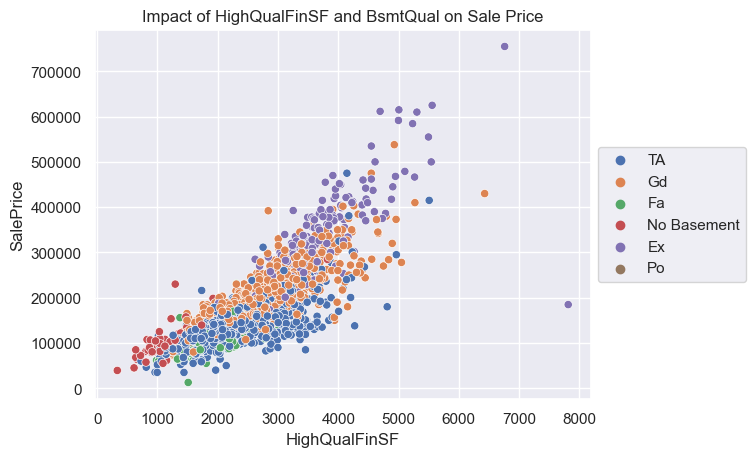

0.6752366121236116


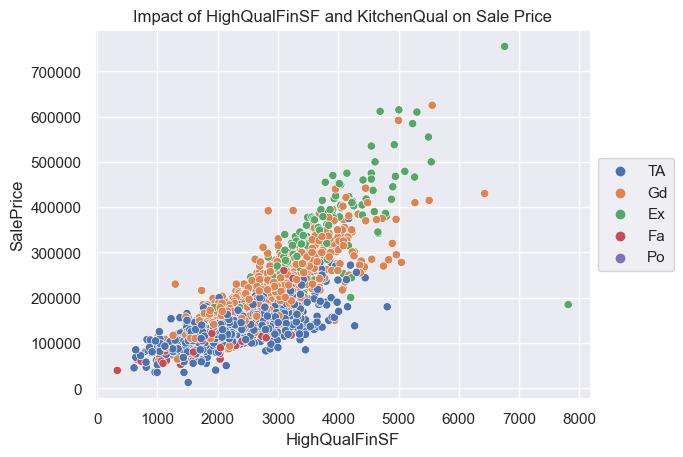

0.6711961597441903


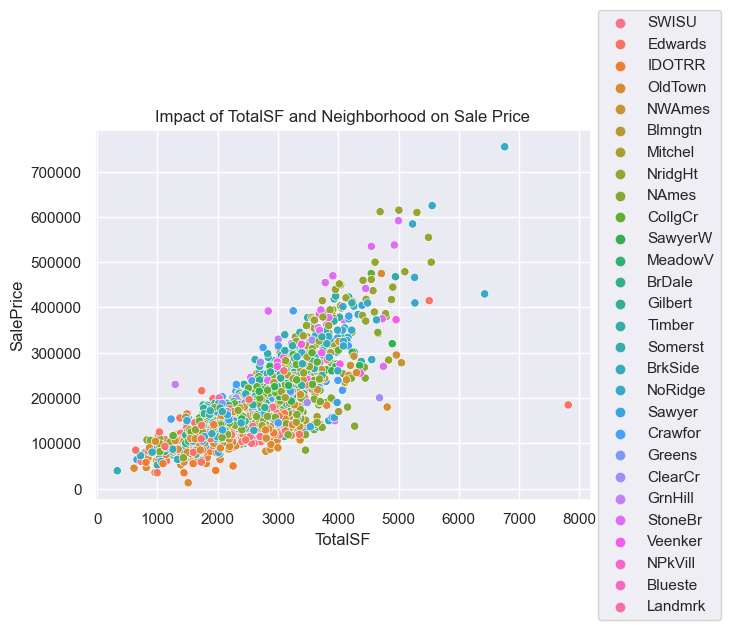

0.6711961597441903


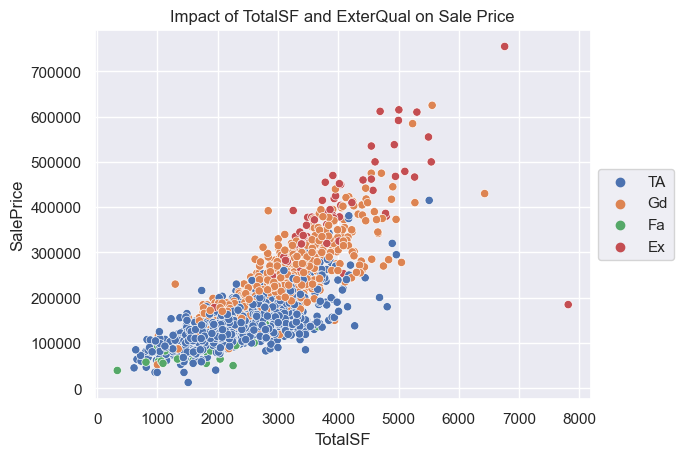

0.6711961597441903


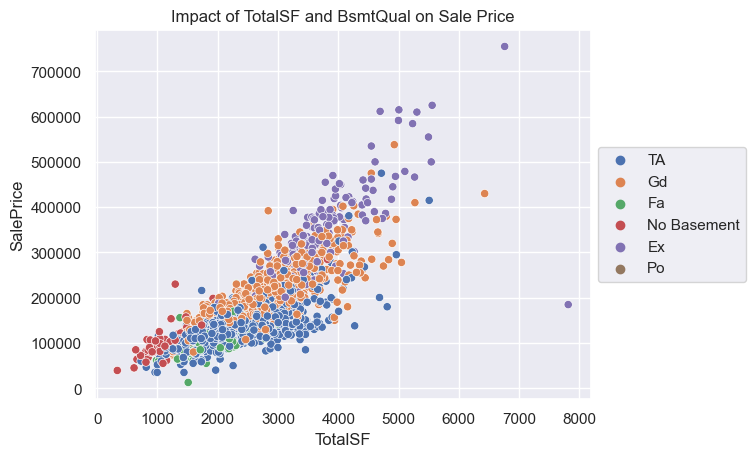

0.6711961597441903


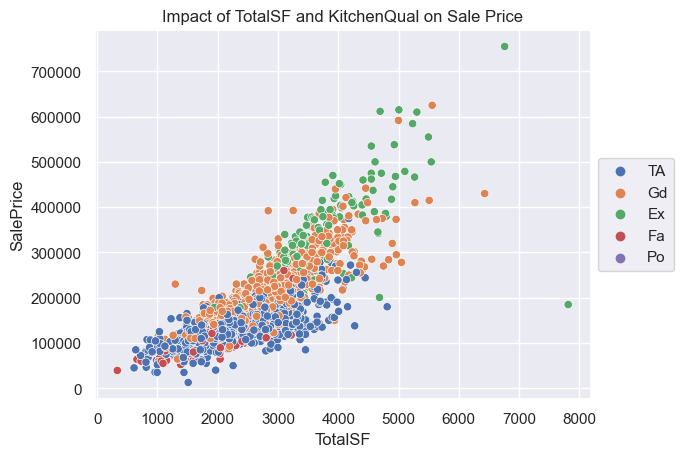

0.6251450369427117


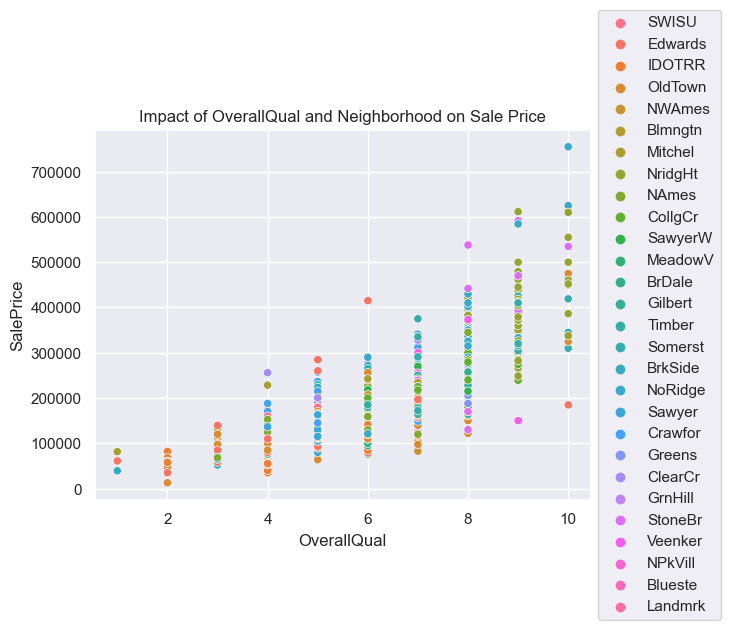

0.6251450369427117


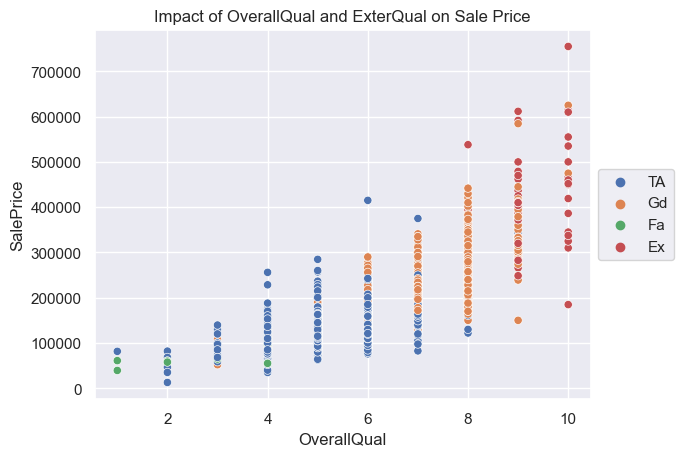

0.6251450369427117


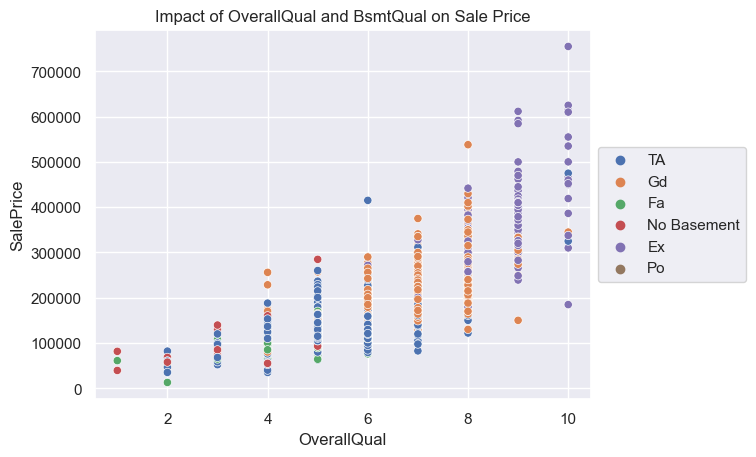

0.6251450369427117


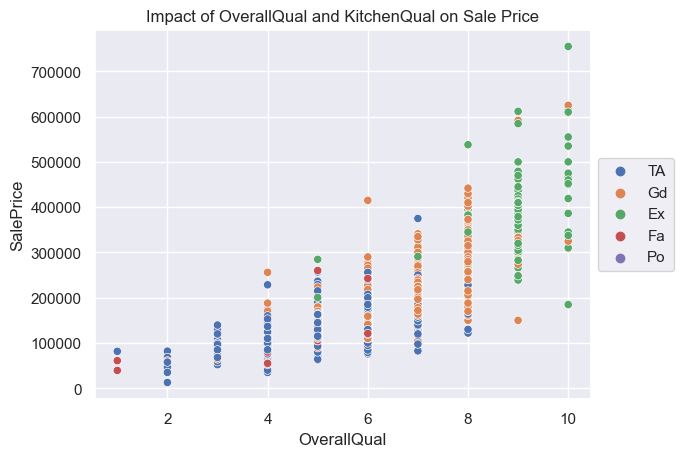

0.5183711142112821


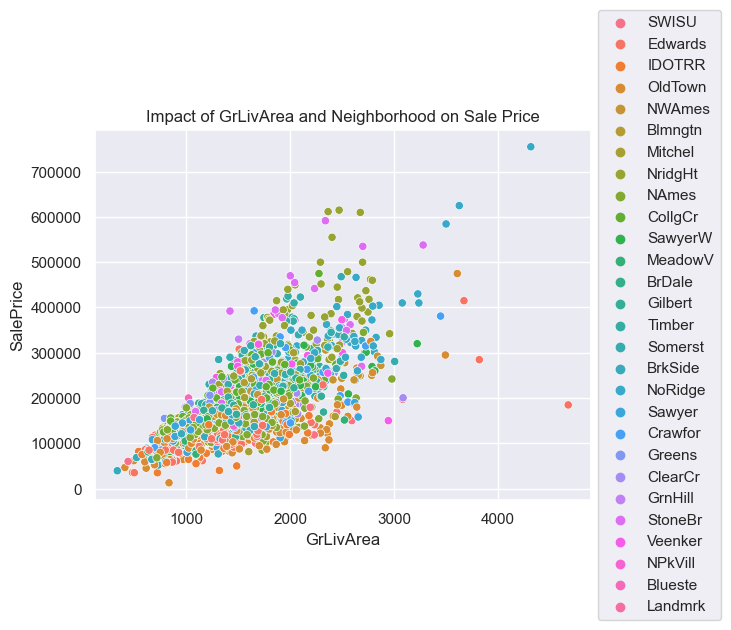

0.5183711142112821


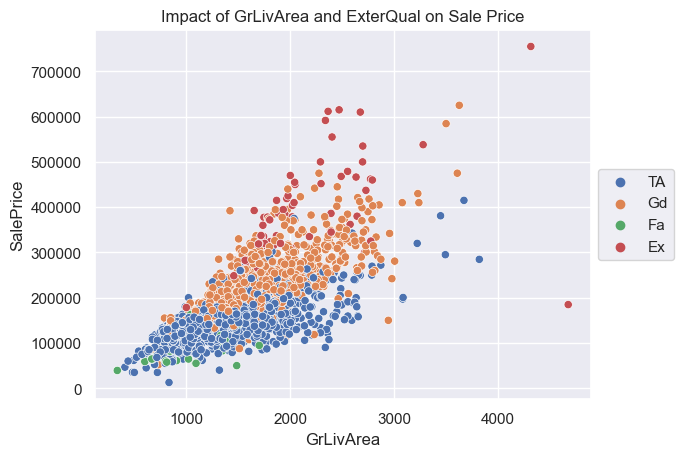

0.5183711142112821


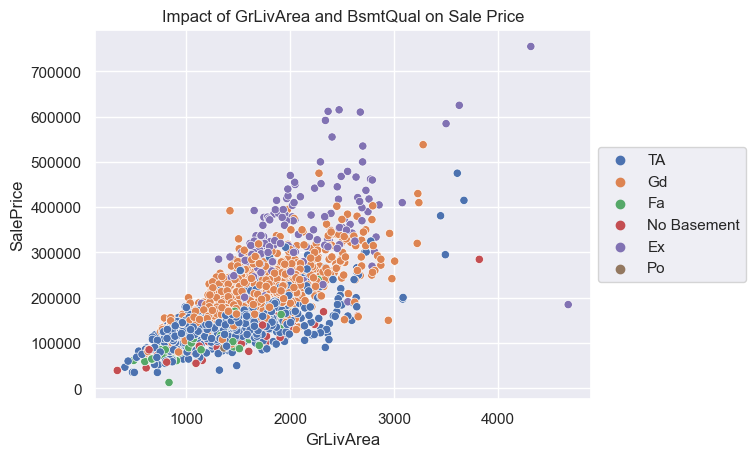

0.5183711142112821


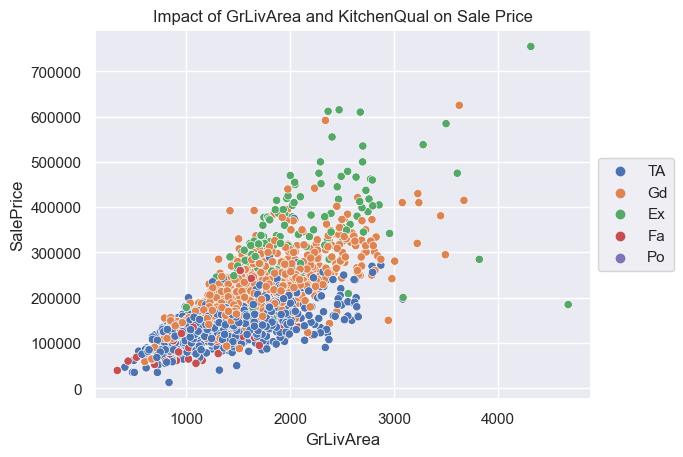

0.4258083391417202


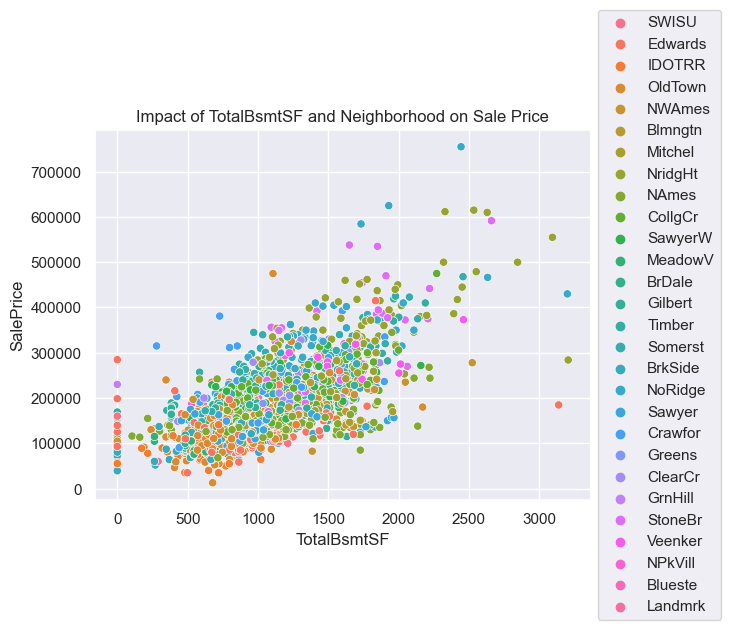

0.4258083391417202


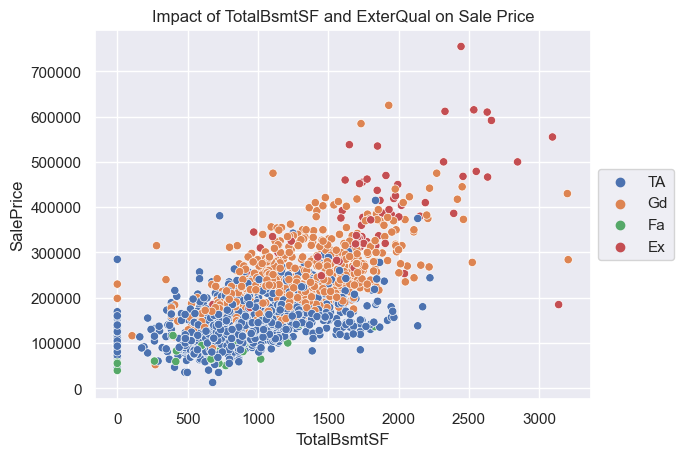

0.4258083391417202


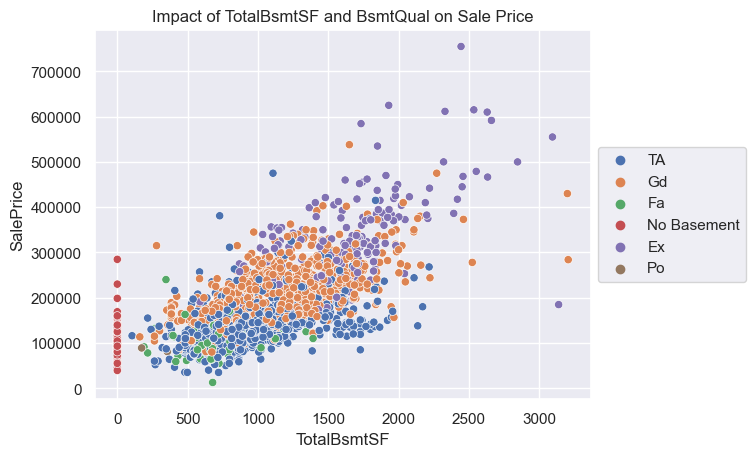

0.4258083391417202


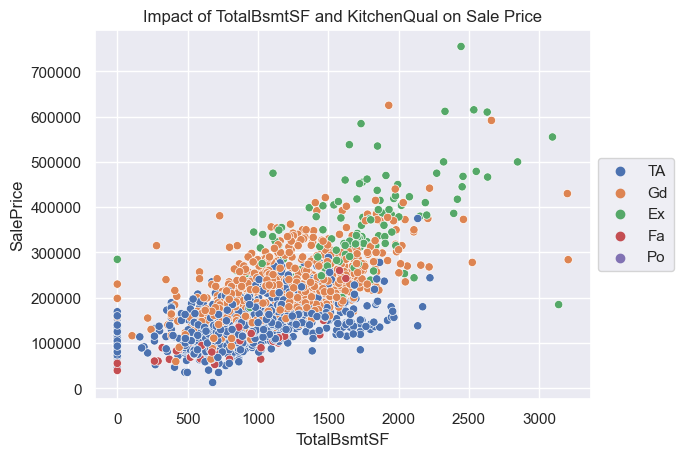

0.4129649523918614


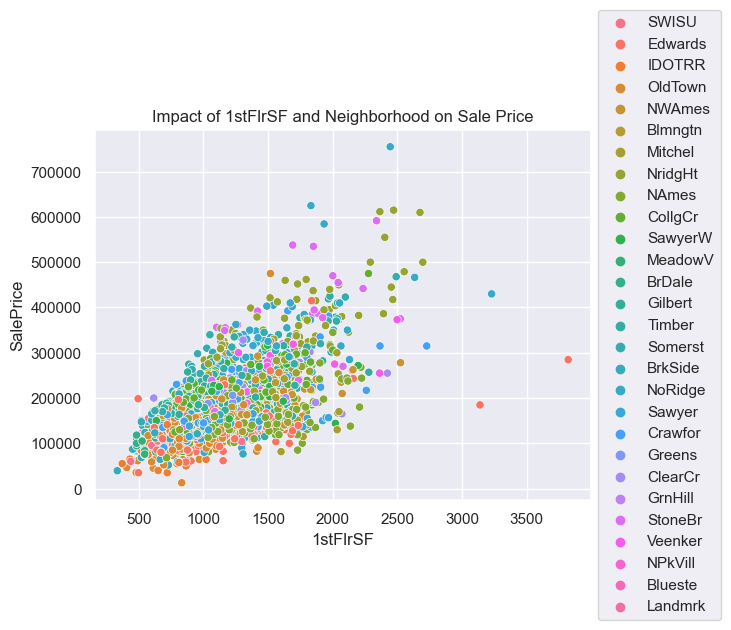

0.4129649523918614


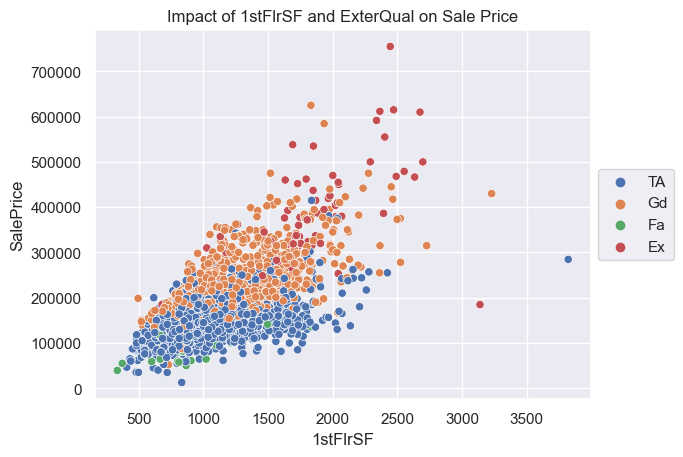

0.4129649523918614


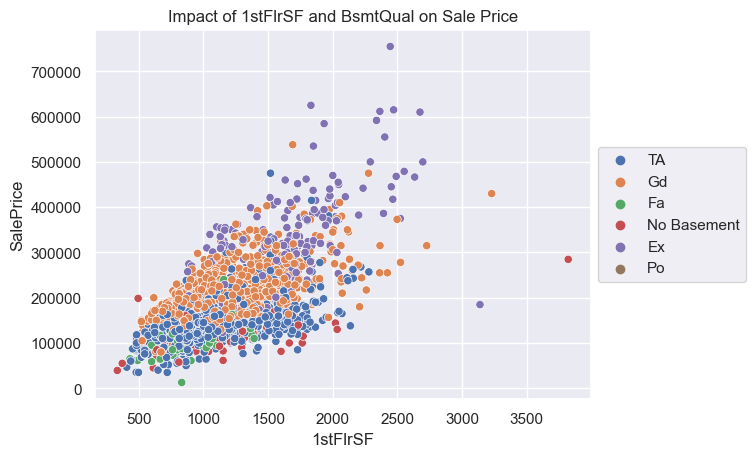

0.4129649523918614


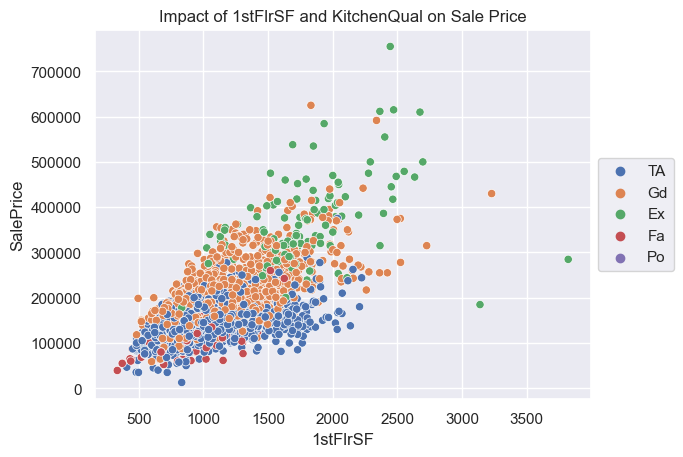

0.4083220048597278


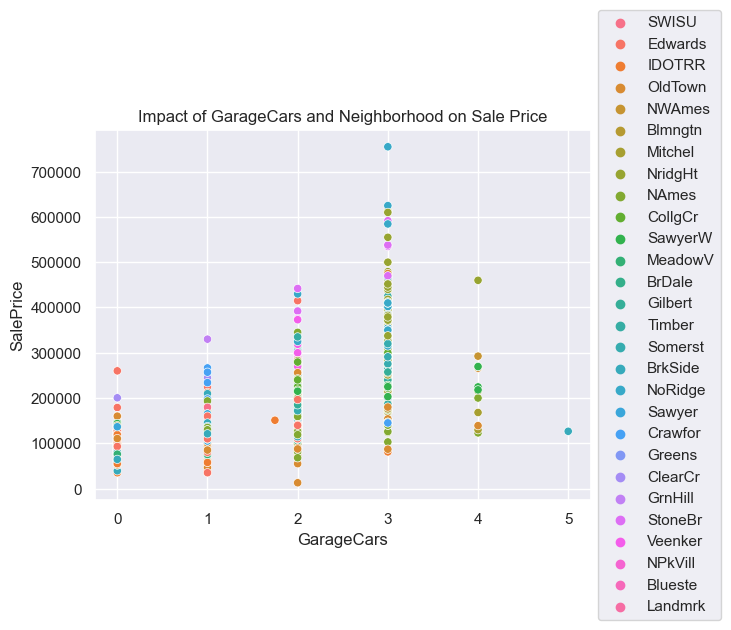

0.4083220048597278


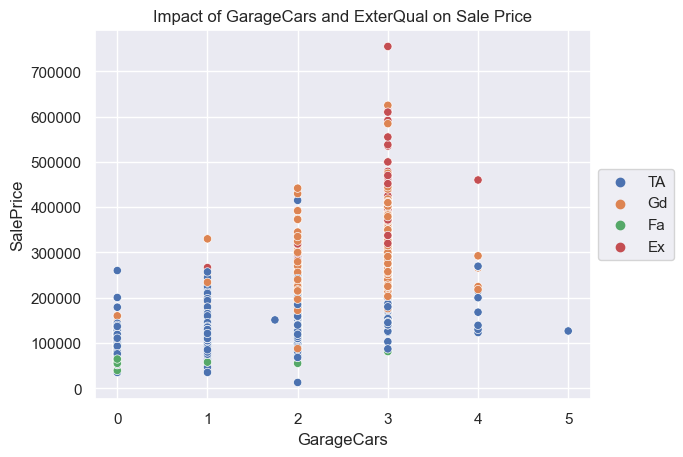

0.4083220048597278


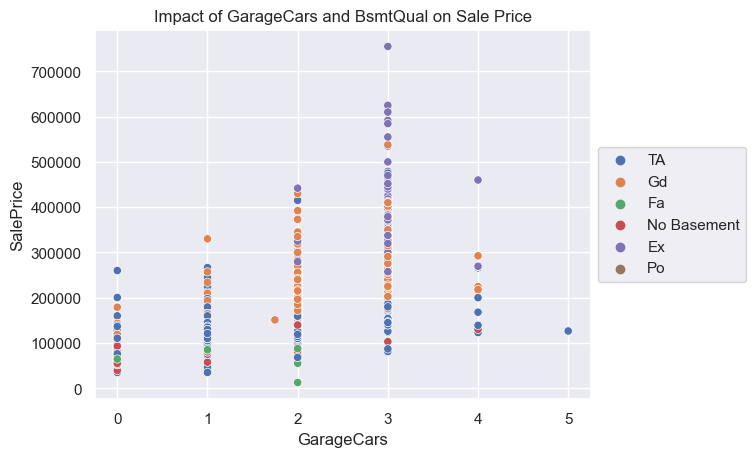

0.4083220048597278


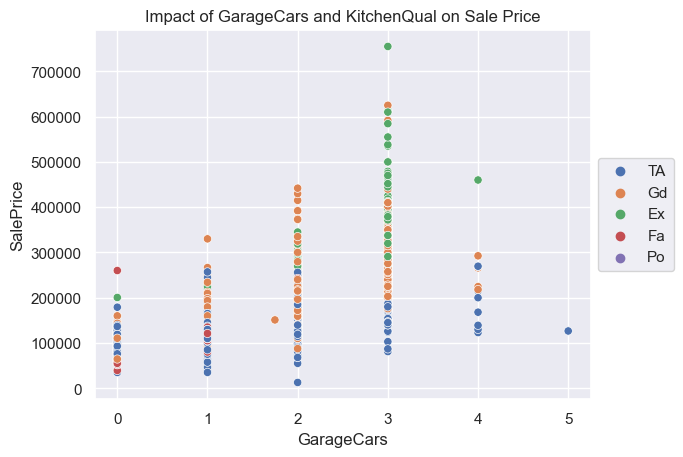

0.4032415263037167


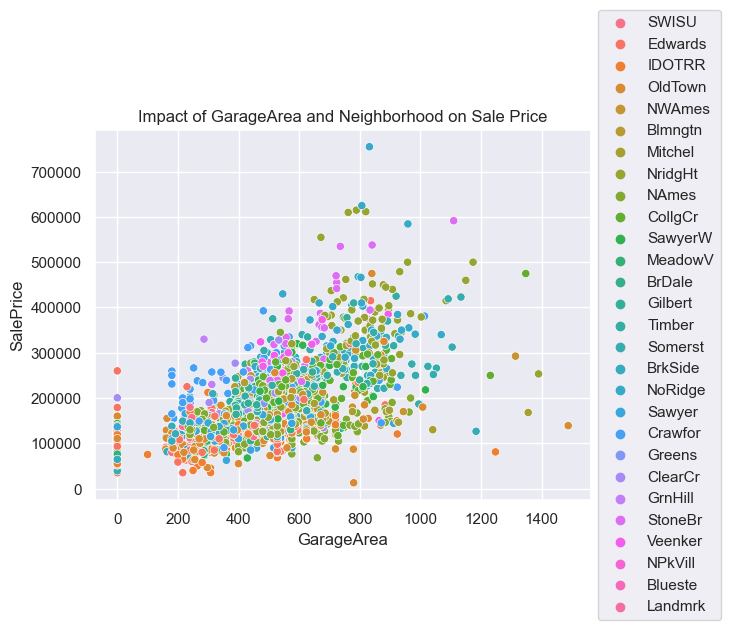

0.4032415263037167


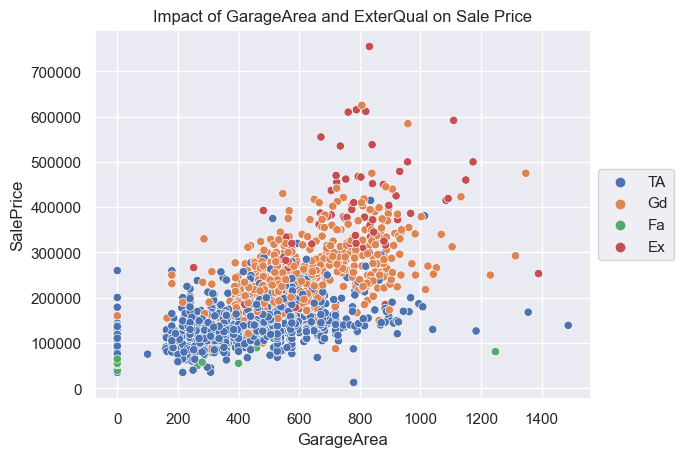

0.4032415263037167


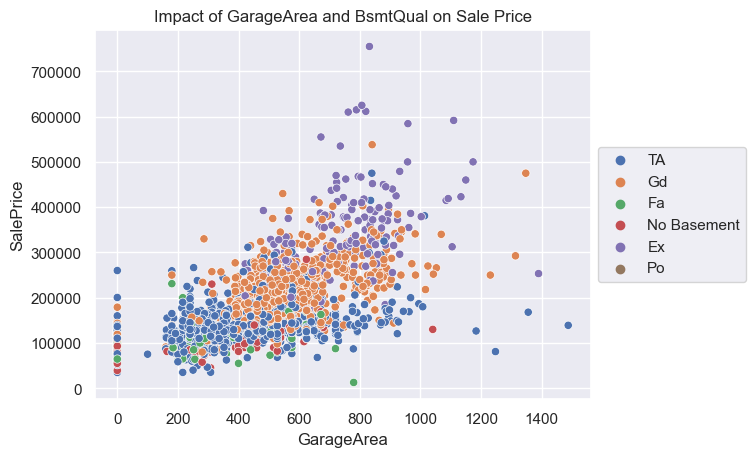

0.4032415263037167


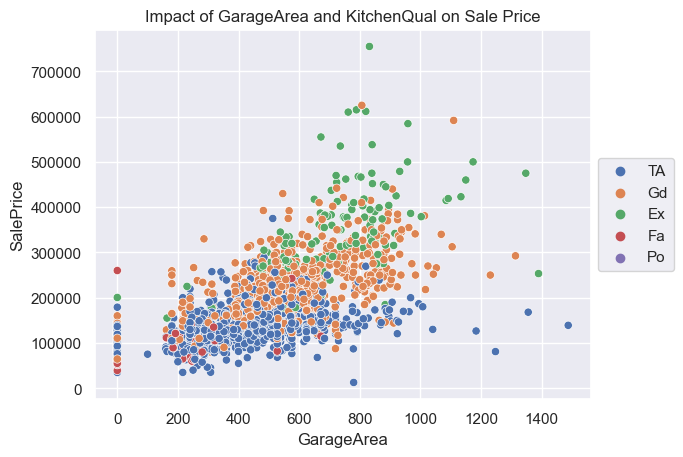

0.35443638711413183


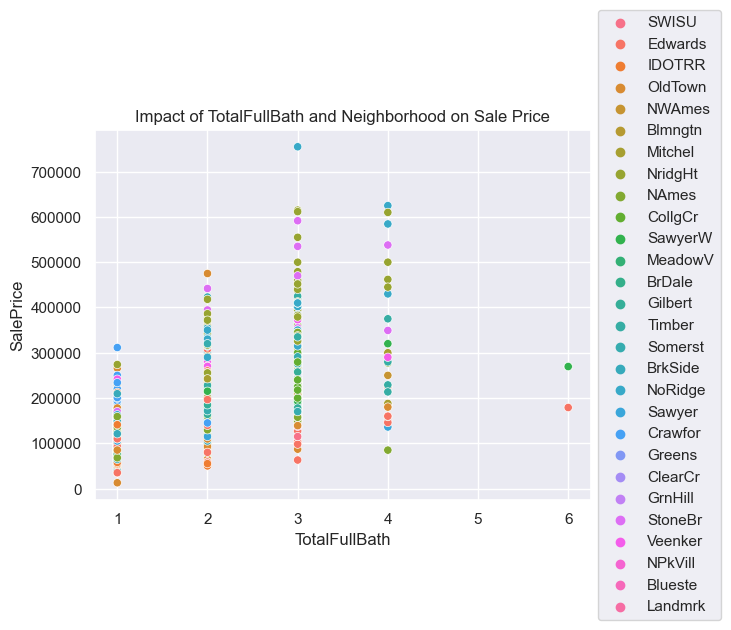

0.35443638711413183


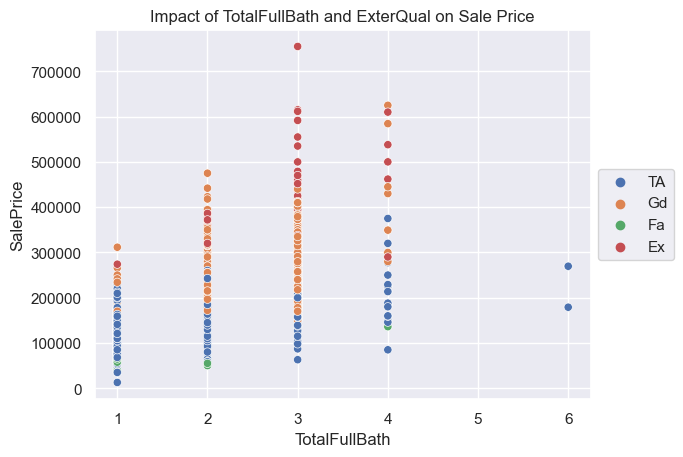

0.35443638711413183


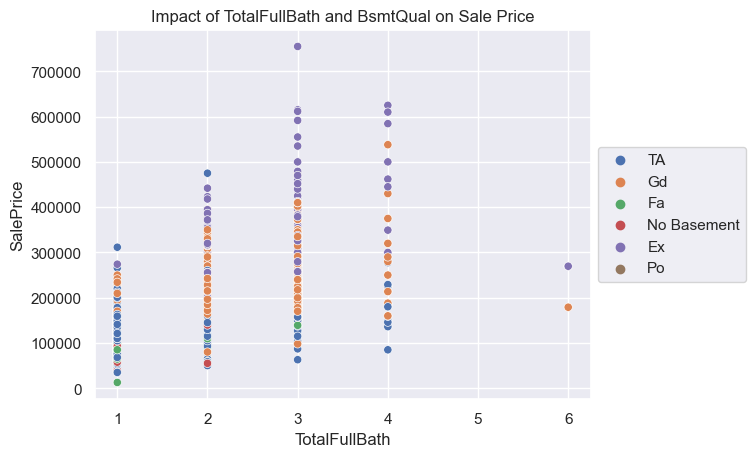

0.35443638711413183


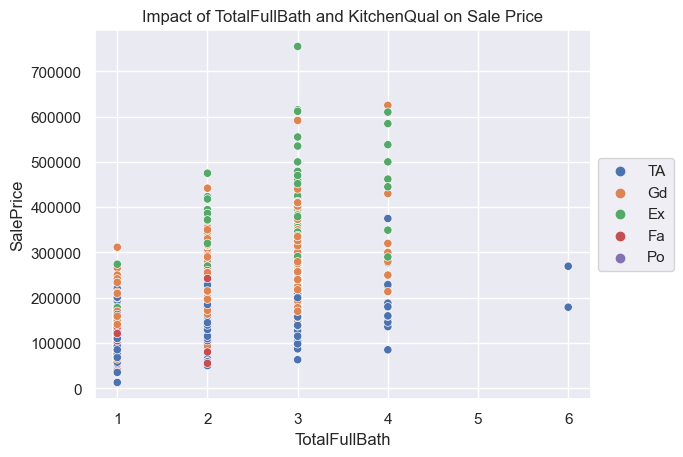

In [44]:
# Looping through numerical columns in top_rsquared_list and creating boxplots against their SalePrice

from sklearn.linear_model import LinearRegression

for num_col in housing_df.loc[:,top_rsquared_list].select_dtypes(include=['int64', 'float64']).columns:
    for cat_col in housing_df.loc[:,top_rsquared_list].select_dtypes(include=['object']).columns:
        temp_df = housing_df.loc[:, [num_col, cat_col, 'SalePrice']]
        
        lm = LinearRegression()
        lm.fit(y = temp_df['SalePrice'], X = temp_df[[num_col]])
        print(lm.score(y = temp_df['SalePrice'], X = temp_df[[num_col]]))
        
        sns.scatterplot(data = temp_df, x = num_col, y = 'SalePrice', hue = cat_col)
        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
        plt.title('Impact of ' + num_col + ' and ' + cat_col +' on Sale Price')
        plt.show()
        
        

0.661705335020202


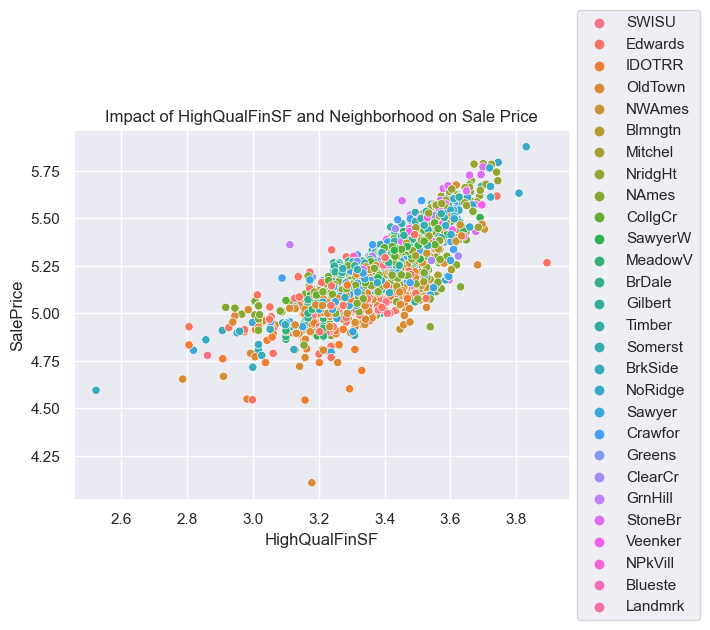

0.661705335020202


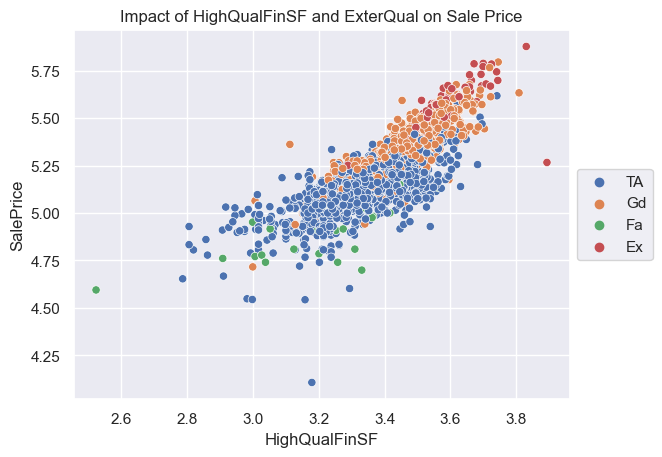

0.661705335020202


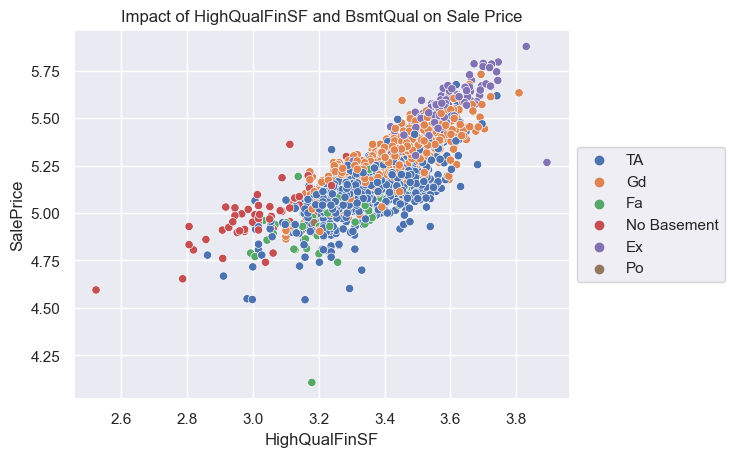

0.661705335020202


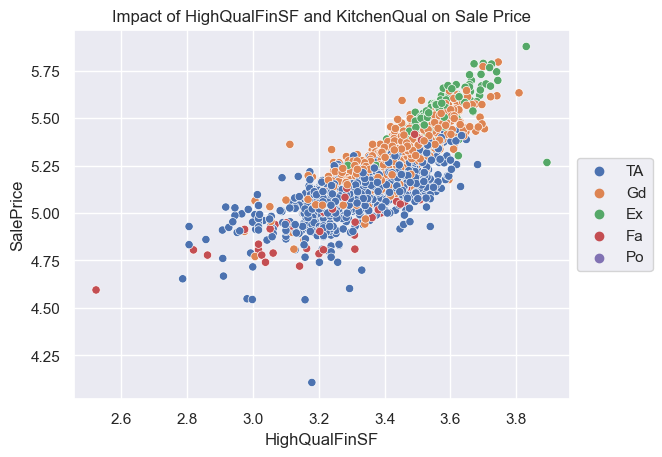

0.6579375878612252


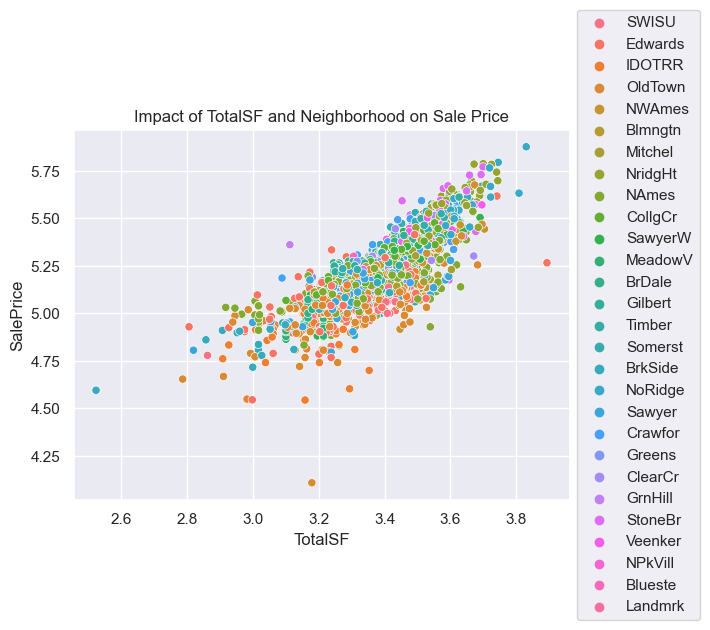

0.6579375878612252


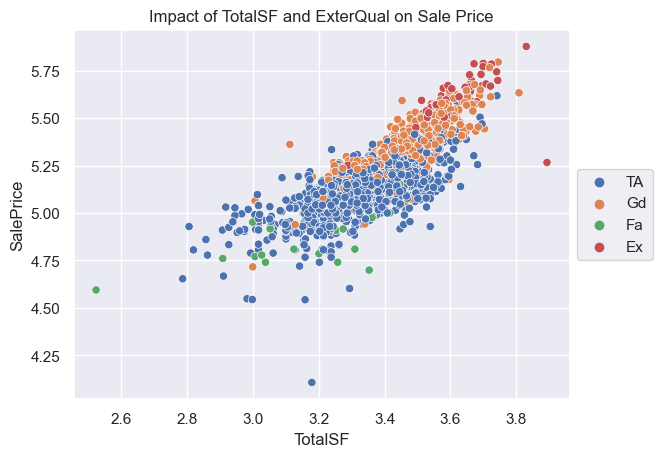

0.6579375878612252


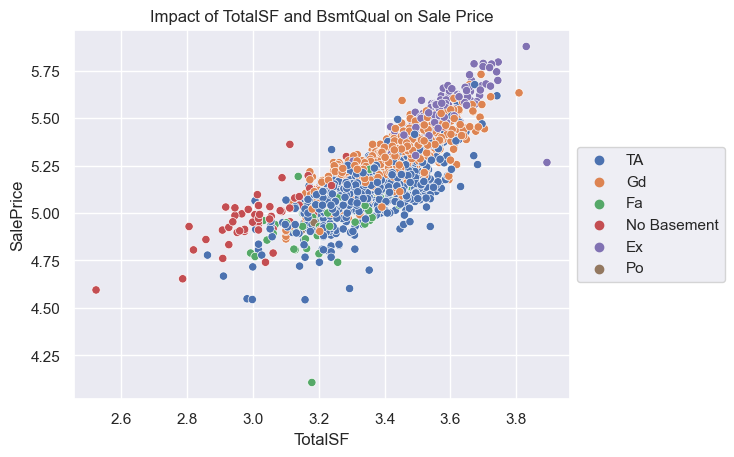

0.6579375878612252


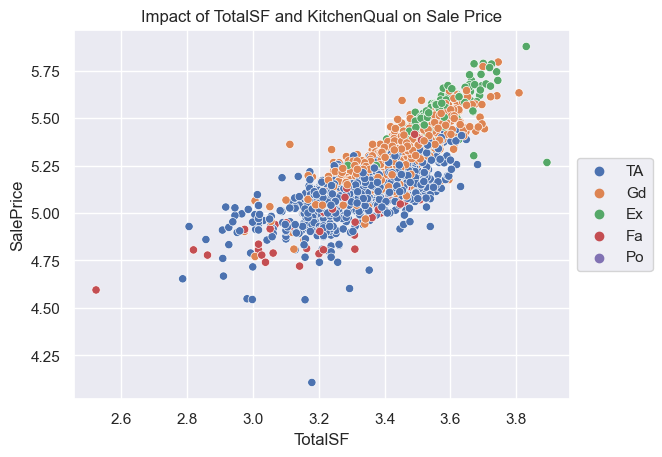

0.6329426925185329


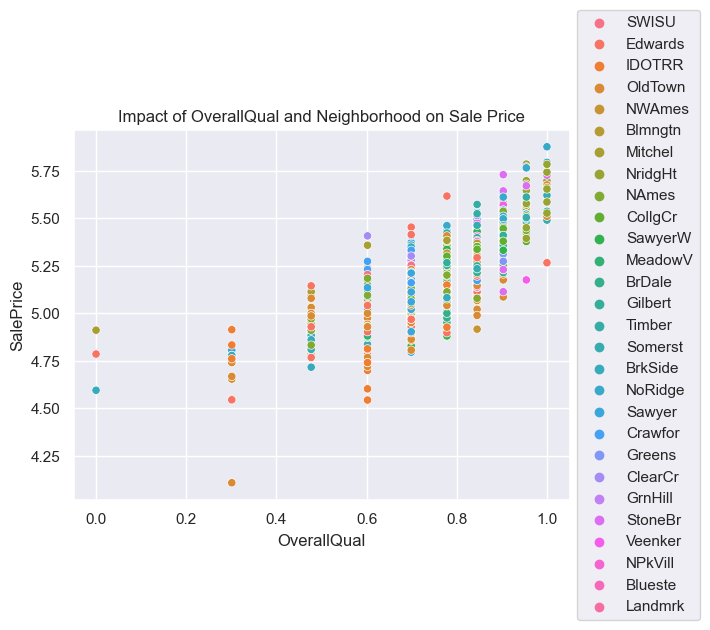

0.6329426925185329


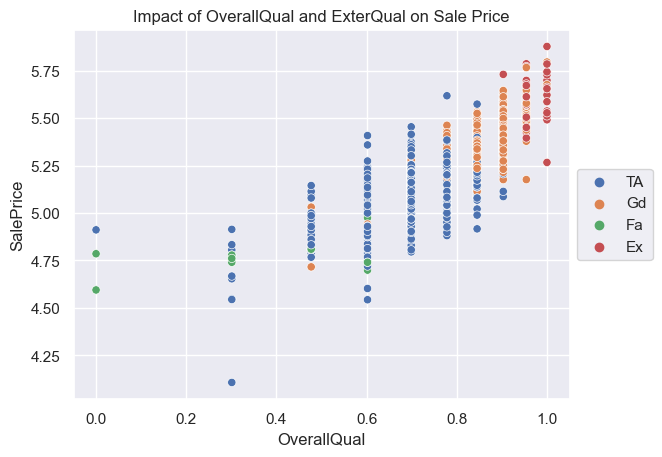

0.6329426925185329


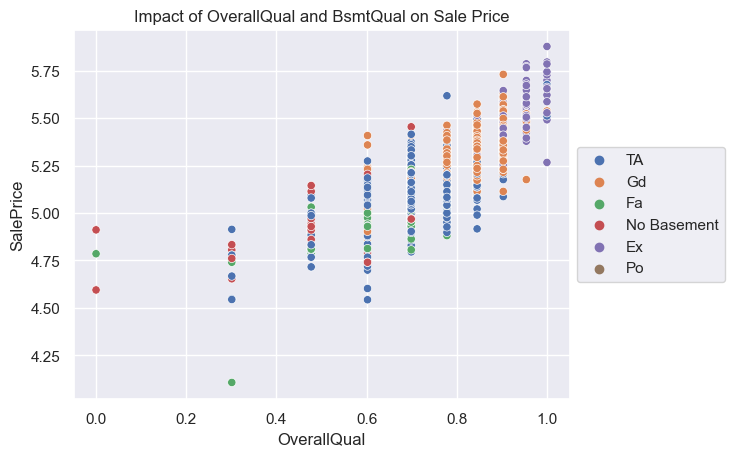

0.6329426925185329


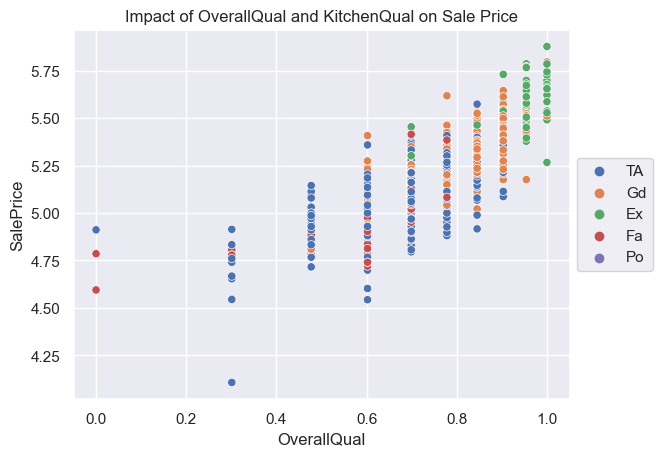

0.5400663903547742


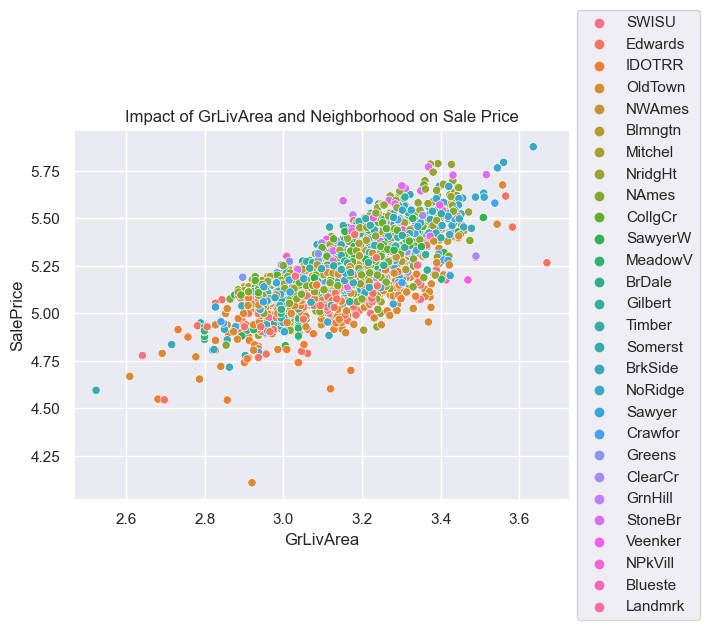

0.5400663903547742


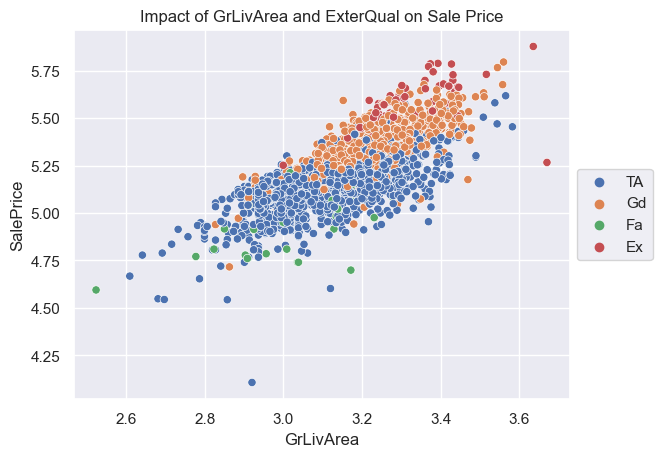

0.5400663903547742


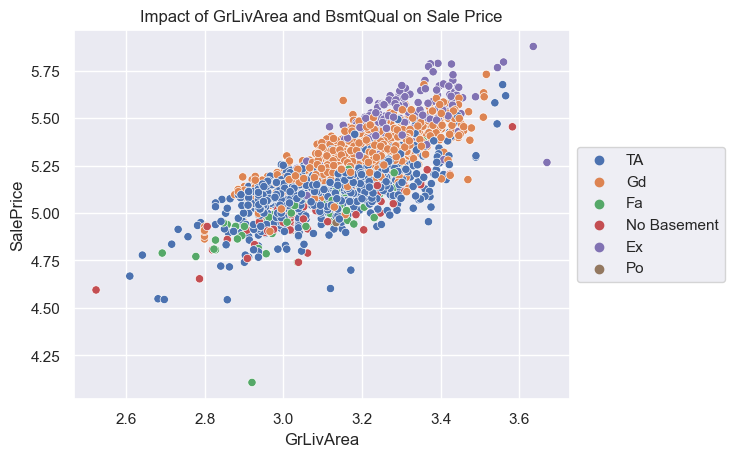

0.5400663903547742


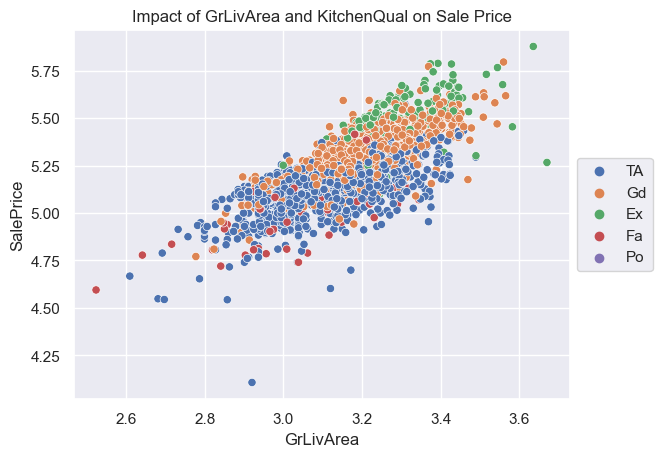

0.06339436607846127


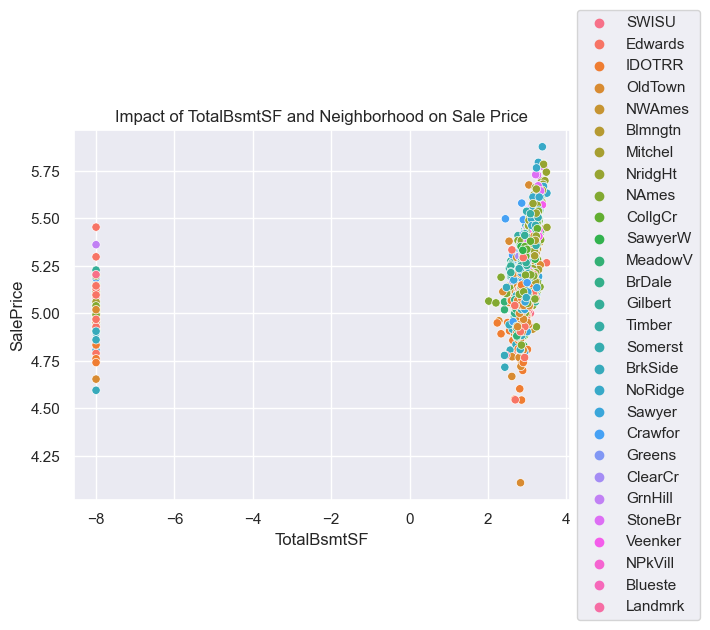

0.06339436607846127


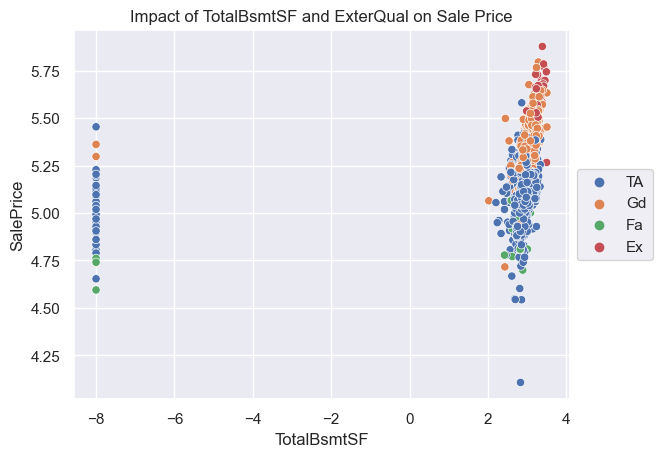

0.06339436607846127


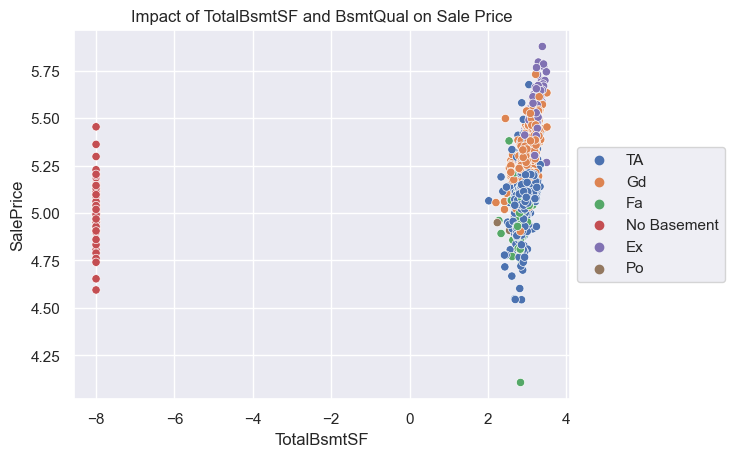

0.06339436607846127


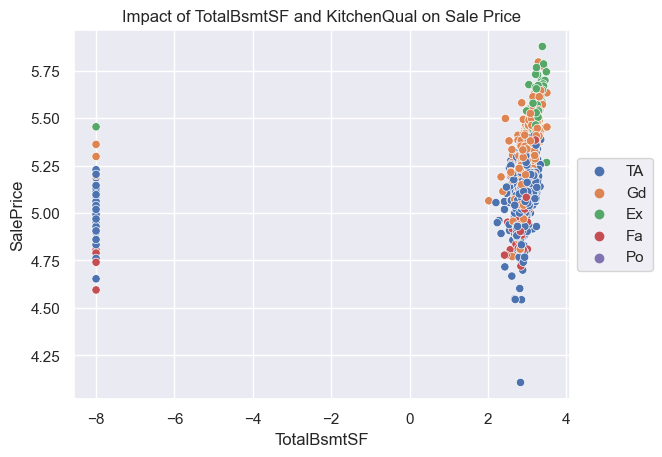

0.3889415182447836


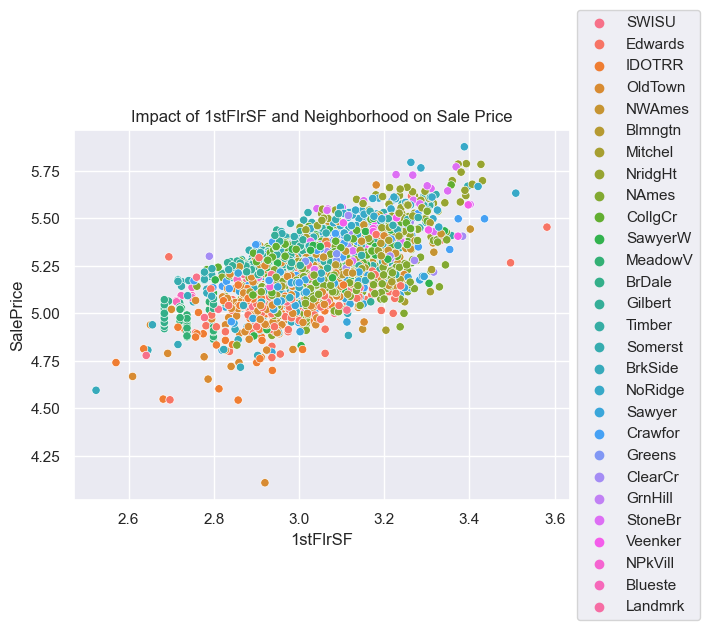

0.3889415182447836


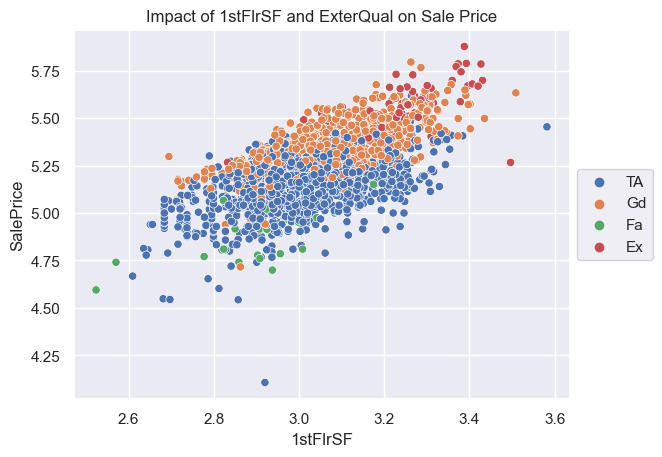

0.3889415182447836


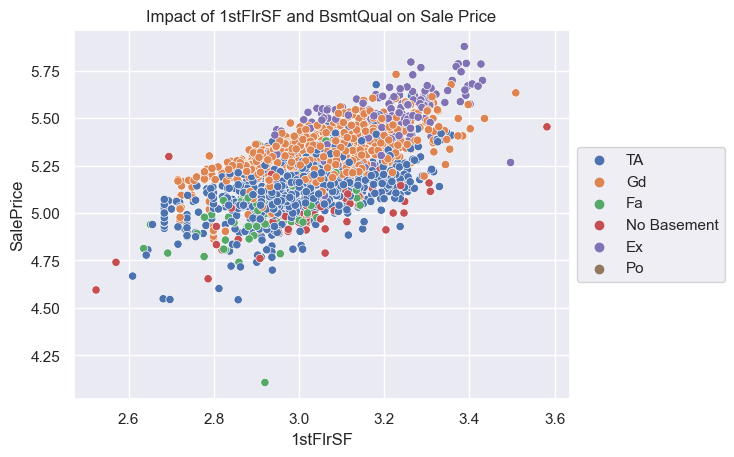

0.3889415182447836


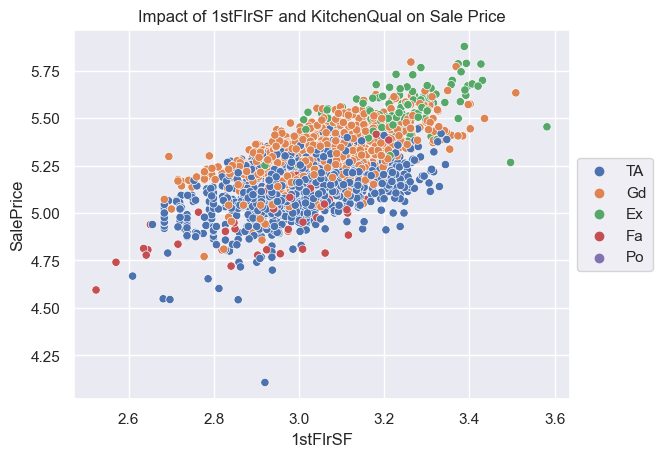

0.11536466800542855


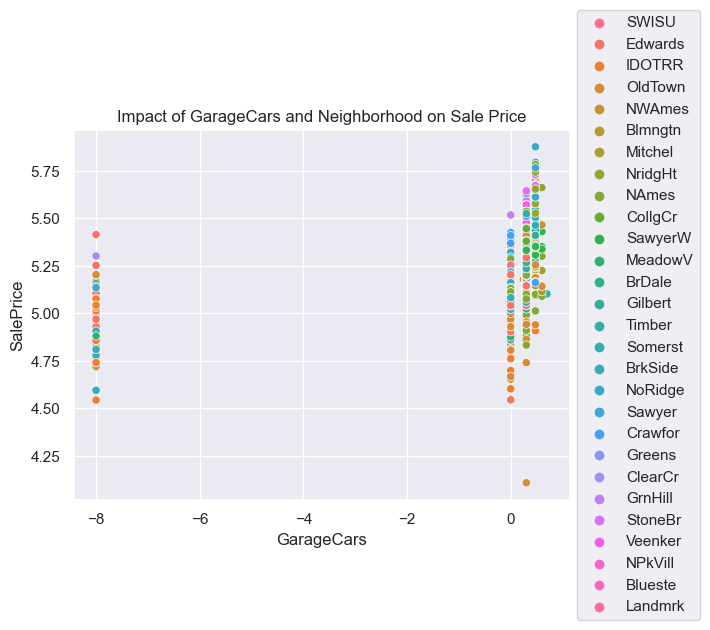

0.11536466800542855


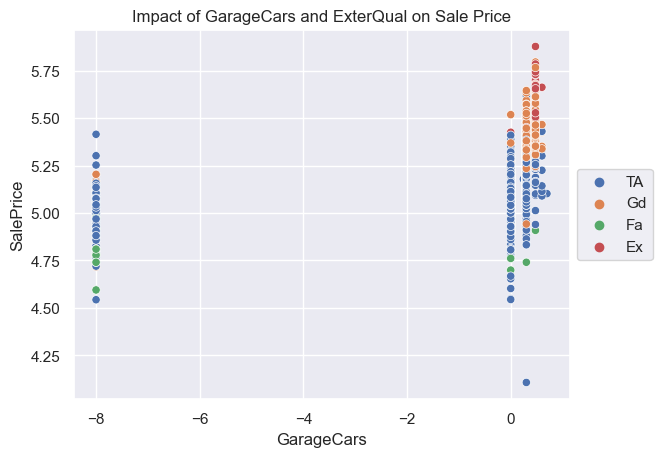

0.11536466800542855


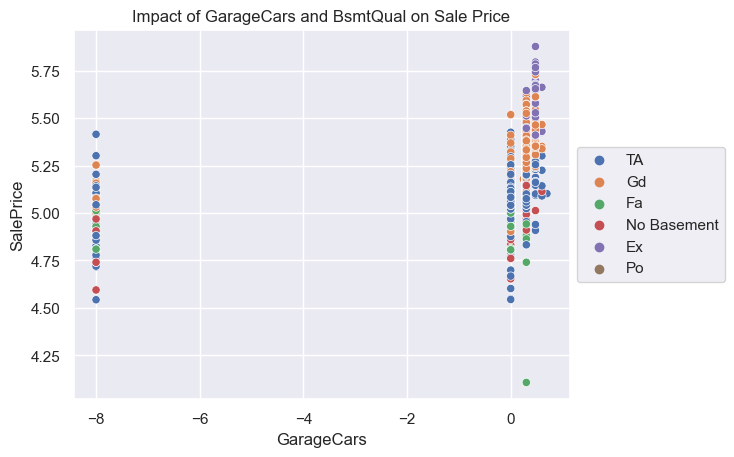

0.11536466800542855


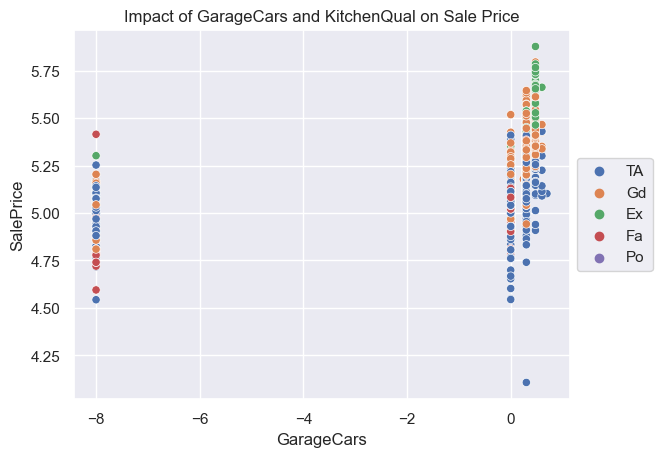

0.10766978139649053


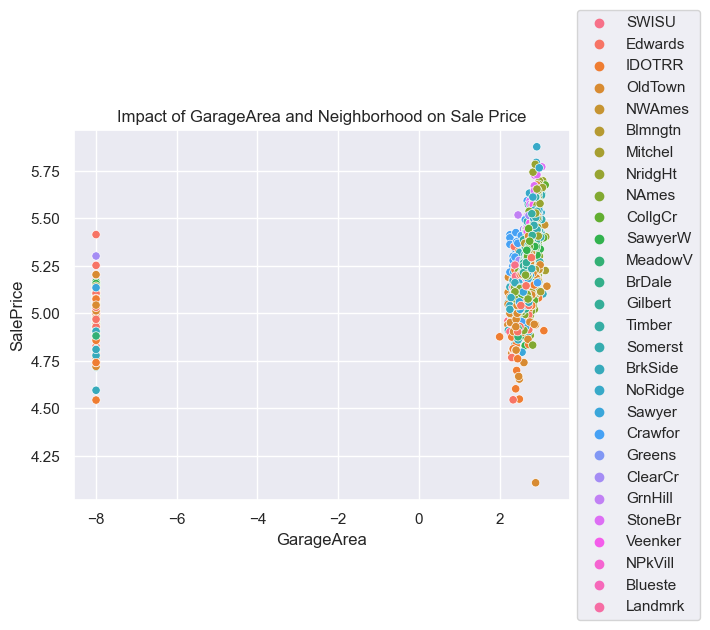

0.10766978139649053


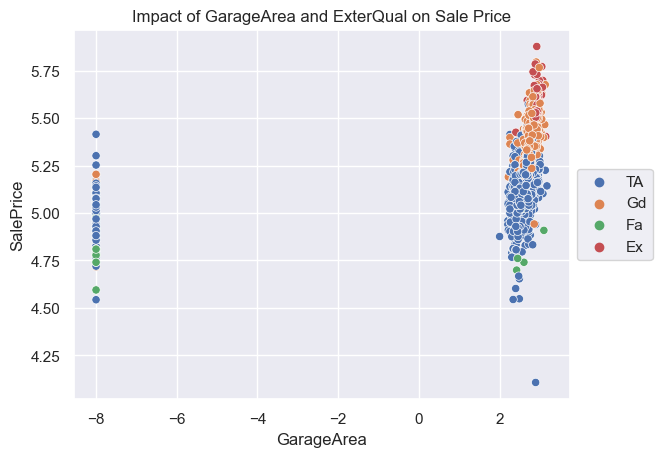

0.10766978139649053


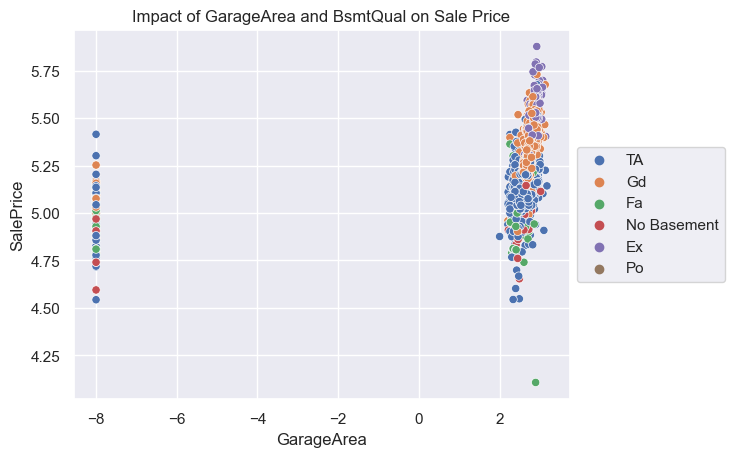

0.10766978139649053


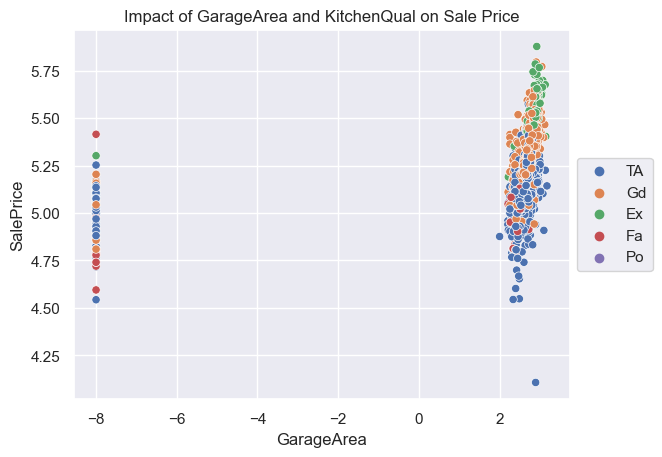

0.37166845381904823


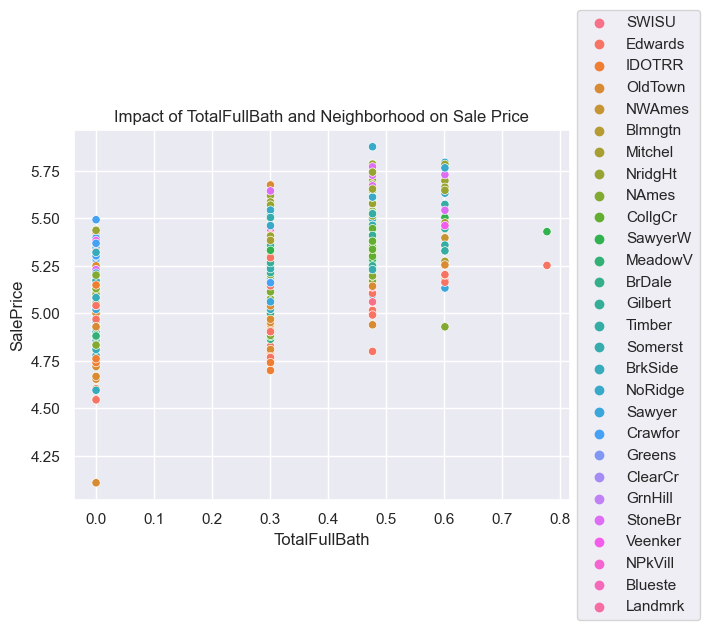

0.37166845381904823


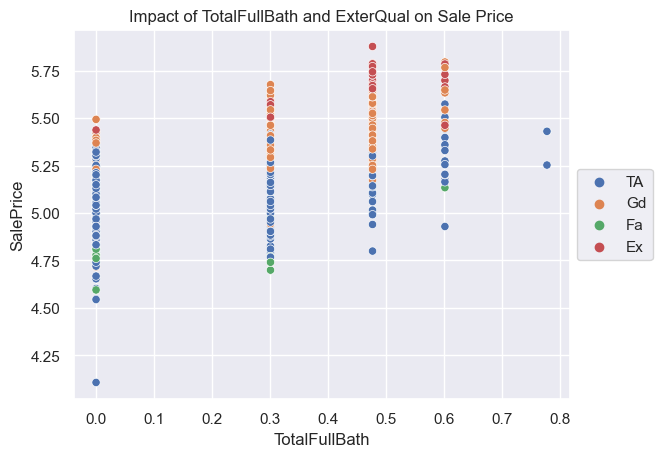

0.37166845381904823


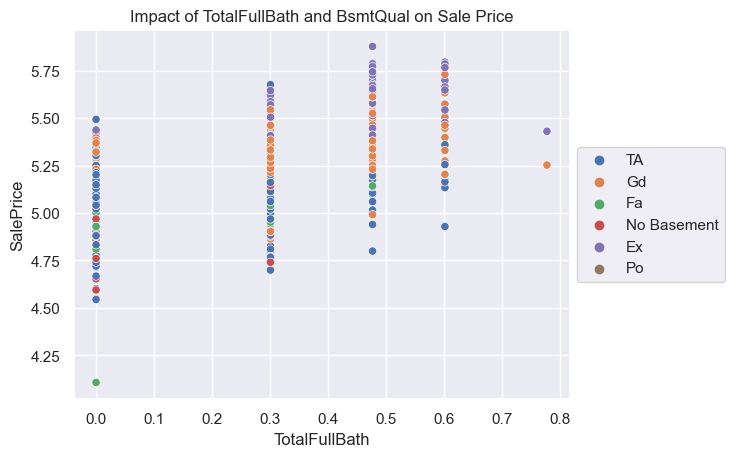

0.37166845381904823


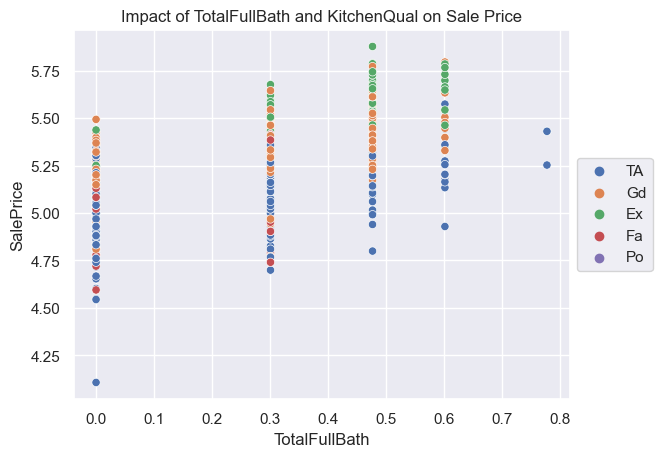

In [45]:
# Looping through numerical columns in top_rsquared_list and creating boxplots against their SalePrice
# This time, taking the log of SalePrice and numerical column



for num_col in housing_df.loc[:,top_rsquared_list].select_dtypes(include=['int64', 'float64']).columns:
    for cat_col in housing_df.loc[:,top_rsquared_list].select_dtypes(include=['object']).columns:
        temp_df = housing_df.loc[:, [num_col, cat_col, 'SalePrice']]
        temp_df[num_col] = np.log10(temp_df[num_col] + 0.00000001)
        temp_df['SalePrice'] = np.log10(temp_df['SalePrice'])
        
        lm = LinearRegression()
        lm.fit(y = temp_df['SalePrice'], X = temp_df[[num_col]])
        print(lm.score(y = temp_df['SalePrice'], X = temp_df[[num_col]]))
        
        
        sns.scatterplot(data = temp_df, x = num_col, y = 'SalePrice', hue = cat_col)
        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
        plt.title('Impact of ' + num_col + ' and ' + cat_col +' on Sale Price')
        plt.show()

Skewness: 1.76
Kurtosis: 5.418


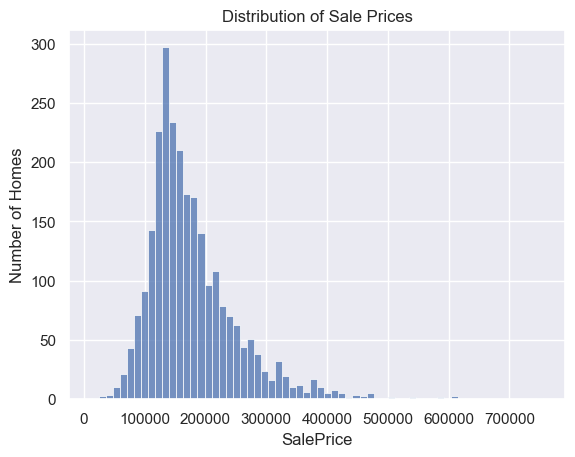

In [47]:

sns.histplot(data = housing_df, x = 'SalePrice')
plt.ylabel('Number of Homes')
plt.title('Distribution of Sale Prices')

print('Skewness: ' + str(round(scipy.stats.skew(housing_df['SalePrice'], axis=0, bias=True),3)))
print('Kurtosis: ' + str(round(scipy.stats.kurtosis(housing_df['SalePrice'], axis=0, fisher=True, bias=True),3)))

# Skewness > 0 signifies more weight on the left tail of the distribution, so it is positively skewed.
# Kurtosis > 0 signifies it's a leptokurtic distribution, meaning there's a greater chance of extreme 
# positive or negative values

Skewness: 0.042
Kurtosis: 1.393


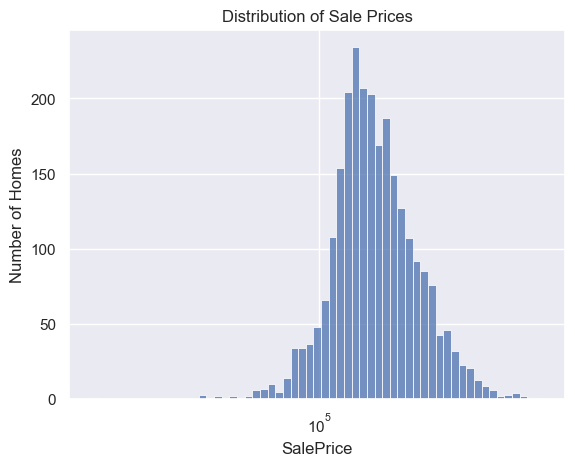

In [48]:

sns.histplot(data = housing_df, x = 'SalePrice', log_scale = True)
plt.ylabel('Number of Homes')
plt.title('Distribution of Sale Prices')

print('Skewness: ' + str(round(scipy.stats.skew(np.log10(housing_df['SalePrice']), axis=0, bias=True),3)))
print('Kurtosis: ' + str(round(scipy.stats.kurtosis(np.log10(housing_df['SalePrice']), axis=0, fisher=True, bias=True),3)))

# Skewness > 0 signifies more weight on the left tail of the distribution, so it is positively skewed.
# Kurtosis > 0 signifies it's a leptokurtic distribution, meaning there's a greater chance of extreme 
# positive or negative values
# Overall, both metrics were significantly reduce by getting the log of SalePrice

# Outlier Removal


## Removing based on EDA

In [49]:
housing_df.loc[np.log10(housing_df['SalePrice']) < 4.25, :]['PID']

428    902207130
Name: PID, dtype: int64

In [50]:
housing_df = housing_df.loc[housing_df['PID'] != 902207130, :]

housing_df.shape

(2578, 90)

## Removing based on modeling

In [51]:
# housing_df = housing_df.loc[(housing_df['PID'] != 908154205), :]

# housing_df.shape

In [52]:
# IQR
Q1 = np.percentile(housing_df['SalePrice'], 25, method='midpoint')
Q3 = np.percentile(housing_df['SalePrice'], 75, method='midpoint')
IQR = Q3 - Q1

upper_1_5_level_outlier = Q3 + (1.5 * IQR)
lower_1_5_level_outlier = Q1 - (1.5 * IQR)
upper_3_0_level_outlier = Q3 + (3.0 * IQR)
lower_3_0_level_outlier = Q1 - (3.0 * IQR)
upper_4_5_level_outlier = Q3 + (4.5 * IQR)
lower_4_5_level_outlier = Q1 - (4.5 * IQR)


print(upper_1_5_level_outlier)
print(upper_3_0_level_outlier)
print(upper_4_5_level_outlier)


329375.0
449000.0
568625.0


Text(0.5, 1.0, 'Distribution of SalePrice')

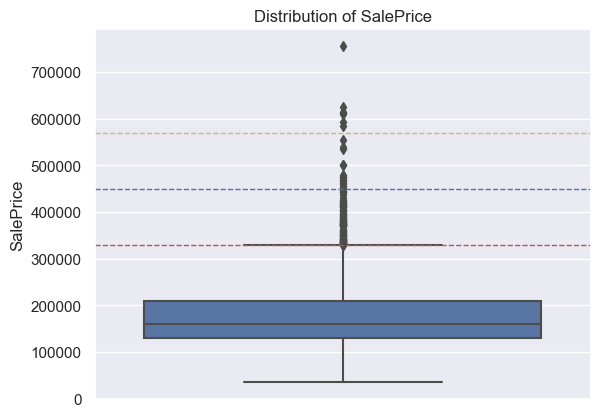

In [53]:
sns.boxplot(data = housing_df, y = 'SalePrice')
plt.axhline(y=upper_1_5_level_outlier, color='r', linestyle='--', linewidth=1)
plt.axhline(y=upper_3_0_level_outlier, color='b', linestyle='--', linewidth=1)
plt.axhline(y=upper_4_5_level_outlier, color='y', linestyle='--', linewidth=1)
plt.title('Distribution of SalePrice')


# Separation of Response and Features


In [54]:
# Create response variable for models

response = housing_df['SalePrice']


In [55]:
# Create features for models
# Dropping PID and SalePrice since it won't be used in the model/is the response, respectively

features = housing_df.drop(columns = ['PID', 'SalePrice'])


# Dummification

## With Drop Column

In [56]:
# Dummification of Categorical Features

cat_features = features.select_dtypes(include=['object'])
cat_features = pd.get_dummies(data = cat_features, drop_first = True)
cat_features = cat_features.replace({False: 0, True: 1})
cat_features.shape


(2578, 231)

In [57]:
# Separating numerical features from dataframe 

num_features = features.select_dtypes(include=['int64', 'float64'])
num_features.shape


(2578, 45)

In [58]:
# Concatenating dummified categorical features with numerical features

features_dum_drop = pd.concat([cat_features, num_features],axis = 1)
features_dum_drop.shape

(2578, 276)

## Without Drop Column

In [59]:
# Dummification of Categorical Features

cat_features = features.select_dtypes(include=['object'])
cat_features = pd.get_dummies(data = cat_features, drop_first = False)
cat_features = cat_features.replace({False: 0, True: 1})
cat_features.shape


(2578, 274)

In [60]:
# Separating numerical features from dataframe 

num_features = features.select_dtypes(include=['int64', 'float64'])
num_features.shape


(2578, 45)

In [61]:
# Concatenating dummified categorical features with numerical features

features_dum_nodrop = pd.concat([cat_features, num_features],axis = 1)
features_dum_nodrop.shape

(2578, 319)

# Label Encoding


In [62]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()

encoded_features_df = pd.DataFrame()
cat_features = features.select_dtypes(include=['object'])

for feat in cat_features:
    encoded_features_df[feat] = le.fit_transform(features[feat])

encoded_features_df.reset_index(drop=True, inplace=True)
num_features.reset_index(drop=True, inplace=True)


features_encoded = pd.concat([encoded_features_df, num_features],axis = 1)
features_encoded.head()

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition,GrLivArea,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,TotalSF,HighQualFinSF,BsmtFinSF,YearsBetweenBuildvsRemod,TotalFullBath,TotalHalfBath,TotalPorch_DeckSF,YearsBetweenBuildvsSold,YearsBetweenRemodvsSold
0,5,1,1,3,3,0,0,0,21,2,2,0,2,1,0,13,14,2,3,4,1,5,5,3,5,6,1,4,1,3,4,6,2,5,3,5,5,2,3,4,1,9,4,856,30,68.510628,7890,6,6,1939,1950,0.0,238.0,0.0,618.0,856.0,856,0,0,1.0,0.0,1,0,2,1,4,1,1939.0,2.0,399.0,0,0,0,0,166,0,0,3,2010,1712.0,1712.0,238.0,11,2.0,0.0,166,71,60
1,5,1,1,3,3,0,4,0,7,2,2,4,2,1,0,6,6,1,2,4,1,2,5,2,2,0,1,4,1,3,2,6,3,1,0,5,5,2,3,4,1,9,4,1049,120,42.000000,4235,5,5,1984,1984,149.0,552.0,393.0,104.0,1049.0,1049,0,0,1.0,0.0,2,0,2,1,5,0,1984.0,1.0,266.0,0,105,0,0,0,0,0,2,2009,2098.0,2098.0,945.0,0,3.0,0.0,105,25,25
2,1,1,1,3,3,0,4,0,11,2,2,0,2,3,0,8,8,2,2,4,0,5,5,3,0,6,1,0,1,3,2,6,3,5,3,5,4,0,3,4,1,9,4,1001,30,60.000000,6060,5,9,1930,2007,0.0,737.0,0.0,100.0,837.0,1001,0,0,0.0,0.0,1,0,2,1,5,0,1930.0,1.0,216.0,154,0,42,86,0,0,0,11,2007,1838.0,1838.0,737.0,77,1.0,0.0,282,77,0
3,5,1,1,3,3,0,0,0,20,2,2,0,5,1,0,8,8,2,2,2,0,1,5,3,6,6,1,2,1,3,4,6,3,5,3,5,5,0,3,4,1,9,4,1039,70,80.000000,8146,4,8,1900,2003,0.0,0.0,0.0,405.0,405.0,717,322,0,0.0,0.0,1,0,2,1,6,0,1940.0,1.0,281.0,0,0,168,0,111,0,0,5,2009,1444.0,1444.0,0.0,103,1.0,0.0,279,109,6
4,5,1,1,3,3,0,4,0,17,2,2,0,5,1,0,12,13,2,2,4,2,2,5,3,2,6,1,0,1,3,2,6,3,1,0,5,5,2,3,4,1,9,4,1665,60,70.000000,8400,8,6,2001,2001,0.0,643.0,0.0,167.0,810.0,810,855,0,1.0,0.0,2,1,3,1,6,0,2001.0,2.0,528.0,0,45,0,0,0,0,0,11,2009,2475.0,2475.0,643.0,0,3.0,1.0,45,8,8


# Train-Test-Split


In [63]:
# Train_test_split: test dataset is 20% of original dataframe, random_state turned on to ensure reproducibility

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(features, response, test_size=0.2, random_state=0)
X_train_drop, X_test_drop, y_train_drop, y_test_drop = train_test_split(features_dum_drop, response, test_size=0.2, random_state=0)
X_train_nodrop, X_test_nodrop, y_train_nodrop, y_test_nodrop = train_test_split(features_dum_nodrop, response, test_size=0.2, random_state=0)
X_train_encoded, X_test_encoded, y_train_encoded, y_test_encoded = train_test_split(features_encoded, response, test_size=0.2, random_state=0)


# Standarization - Train/Test Splits

In [64]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train_drop_scaled = scaler.fit_transform(X_train_drop)
X_train_drop_scaled = pd.DataFrame(data=X_train_drop_scaled, columns=X_train_drop.columns)

X_test_drop_scaled = scaler.transform(X_test_drop)
X_test_drop_scaled = pd.DataFrame(data=X_test_drop_scaled, columns=X_test_drop.columns)



In [65]:

scaler = StandardScaler()

X_train_nodrop_scaled = scaler.fit_transform(X_train_nodrop)
X_train_nodrop_scaled = pd.DataFrame(data=X_train_nodrop_scaled, columns=X_train_nodrop.columns)

X_test_nodrop_scaled = scaler.transform(X_test_nodrop)
X_test_nodrop_scaled = pd.DataFrame(data=X_test_nodrop_scaled, columns=X_test_nodrop.columns)


# Data Export

In [66]:
import os

current_directory = os.getcwd()

dataframes = {'features': features,
              'features_dum_drop': features_dum_drop,
              'features_dum_nodrop': features_dum_nodrop,
              'features_encoded': features_encoded,
              'response': response,
              'X_train_drop': X_train_drop, 
              'X_test_drop': X_test_drop, 
              'y_train_drop': y_train_drop, 
              'y_test_drop': y_test_drop,
              'X_train_nodrop': X_train_nodrop, 
              'X_test_nodrop': X_test_nodrop, 
              'y_train_nodrop': y_train_nodrop, 
              'y_test_nodrop': y_test_nodrop,
              'X_train_encoded': X_train_encoded, 
              'X_test_encoded': X_test_encoded, 
              'y_train_encoded': y_train_encoded, 
              'y_test_encoded': y_test_encoded,
              'X_train_drop_scaled': X_train_drop_scaled, 
              'X_test_drop_scaled': X_test_drop_scaled,
              'X_train_nodrop_scaled': X_train_nodrop_scaled, 
              'X_test_nodrop_scaled': X_test_nodrop_scaled}


for name, df in dataframes.items():

    file_path = os.path.join(current_directory, f"{name}.csv")
    
    # Save the dataframe to a CSV file
    df.to_csv(file_path, sep='\t', index=False)